In [2]:
# Extract Fedorenko fROIs - Per Session
"""
Extract top 10% voxels from Fedorenko language parcels
Works with unified GLM results structure
Creates session-specific fROI masks
"""
import warnings
warnings.filterwarnings("ignore")

from pathlib import Path
import numpy as np
import nibabel as nib
from nilearn.image import resample_to_img
from nilearn import plotting
import matplotlib.pyplot as plt

# =============================================================================
# CONFIGURATION
# =============================================================================
TOP_PERCENT = 0.10  # Top 10%
TOP_VOXELS = 10
ROOT = Path("/scratch/ibilgin/cneuromod.langlocalizer.fmriprep")
GLM_ROOT = ROOT / "langlocalizer_glm_results"  # NEW unified structure

SUBJECTS = ["sub-01", "sub-02", "sub-03", "sub-05"]

# Updated task contrasts to match new GLM output
TASK_CONTRASTS = {
    "aliceFr": ["int-degr"],
    "aliceEn": ["int-degr"],
    "listening": ["int-degr"],
    "reading": ["word-nonword"],  # Updated: no hyphen in middle
}


# Language Localizer task definitions
LANGLOC_CONTRASTS = {
    "listening": {
        "contrast": "int-degr",
        "modality": "auditory",
        "language": "English",
        "domain": "language"
    },
    "aliceFr": {
        "contrast": "int-degr",
        "modality": "auditory",
        "language": "French",
        "domain": "language"
    },
    "aliceEn": {
        "contrast": "int-degr",
        "modality": "auditory",
        "language": "English",
        "domain": "language"
    },
    "reading": {
        "contrast": "word-nonword",
        "modality": "visual",
        "language": "English",
        "domain": "language"
    }
}

SUBJECT_COLORS = {
    "sub-01": "#E74C3C",
    "sub-02": "#2ECC71",
    "sub-03": "#3498DB",
    "sub-05": "#F39C12",
    "sub-06": "#9B59B6",
}


# Fedorenko atlas
FED_ATLAS_NII = Path("/scratch/ibilgin/fedorenko_atlas/allParcels-language-SN220.nii")
FED_ATLAS_TXT = Path("/scratch/ibilgin/fedorenko_atlas/allParcels-language-SN220.txt")

# Output directories
OUT_DIR = ROOT / f"fedorenko_fROIs_top{TOP_VOXELS}_updated"
OUT_DIR.mkdir(exist_ok=True, parents=True)

PNG_DIR = OUT_DIR / "qc_png_updated"
PNG_DIR.mkdir(exist_ok=True, parents=True)


# LANG_GLM = ROOT / "glm_results_unified"
LANG_GLM = ROOT / "langlocalizer_glm_results"
FIG_DIR = ROOT / f"figures_integrated_analysis_{TOP_VOXELS}_top"
FIG_DIR.mkdir(parents=True, exist_ok=True)

print("="*80)
print("FEDORENKO fROI EXTRACTION")
print("="*80)
print(f"GLM results: {GLM_ROOT}")
print(f"Output: {OUT_DIR}")
print(f"Subjects: {SUBJECTS}")



# CELL 2: Merge Parcels into allLANG Masks - Session Level
"""
Combine all Fedorenko parcels into single allLANG masks
Per session
"""
from pathlib import Path
from collections import defaultdict
import numpy as np
import nibabel as nib
from nilearn import plotting
import matplotlib.pyplot as plt


 
allLANG_MASK_DIR = OUT_DIR / f"allLANG_masks_session_top_{TOP_VOXELS}"
allLANG_FIG_DIR = OUT_DIR / f"allLANG_figures_session_top_{TOP_VOXELS}"
allLANG_MASK_DIR.mkdir(exist_ok=True, parents=True)
allLANG_FIG_DIR.mkdir(exist_ok=True, parents=True)


TASK_COLORMAPS = {
    "aliceFr": "Greens",
    "aliceEn": "Blues",
    "listening": "Purples",
    "reading": "Reds",
}



FEDORENKO fROI EXTRACTION
GLM results: /scratch/ibilgin/cneuromod.langlocalizer.fmriprep/langlocalizer_glm_results
Output: /scratch/ibilgin/cneuromod.langlocalizer.fmriprep/fedorenko_fROIs_top10_updated
Subjects: ['sub-01', 'sub-02', 'sub-03', 'sub-05']


# Plots for the language localizer tasks %10 Top Voxels

Top 10% voxels per parcel
CREATING SESSION-LEVEL allLANG MASKS

sub-01 / aliceFr / int-degr
    ✓ Saved: sub-01_ses-001_task-aliceFr_contrast-int-degr_10_allLANG.png
    ✓ Saved: sub-01_ses-002_task-aliceFr_contrast-int-degr_10_allLANG.png
    ✓ Saved: sub-01_ses-003_task-aliceFr_contrast-int-degr_10_allLANG.png

sub-01 / aliceEn / int-degr
    ✓ Saved: sub-01_ses-001_task-aliceEn_contrast-int-degr_10_allLANG.png
    ✓ Saved: sub-01_ses-002_task-aliceEn_contrast-int-degr_10_allLANG.png
    ✓ Saved: sub-01_ses-003_task-aliceEn_contrast-int-degr_10_allLANG.png

sub-01 / listening / int-degr
    ✓ Saved: sub-01_ses-001_task-listening_contrast-int-degr_10_allLANG.png
    ✓ Saved: sub-01_ses-002_task-listening_contrast-int-degr_10_allLANG.png
    ✓ Saved: sub-01_ses-003_task-listening_contrast-int-degr_10_allLANG.png

sub-01 / reading / word-nonword
    ✓ Saved: sub-01_ses-001_task-reading_contrast-word-nonword_10_allLANG.png
    ✓ Saved: sub-01_ses-002_task-reading_contrast-word-nonword_10

<Figure size 1000x600 with 0 Axes>

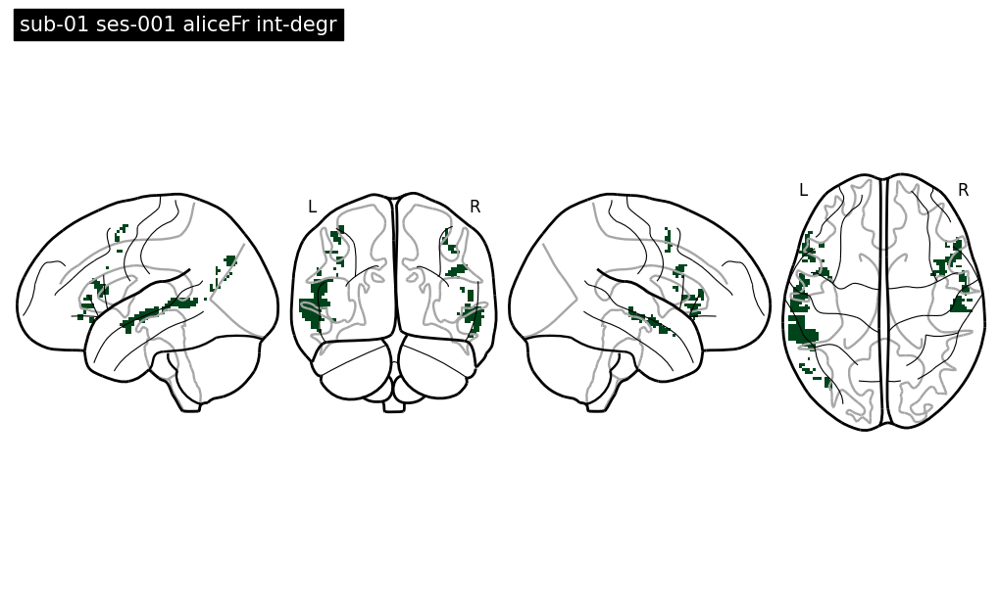

<Figure size 1000x600 with 0 Axes>

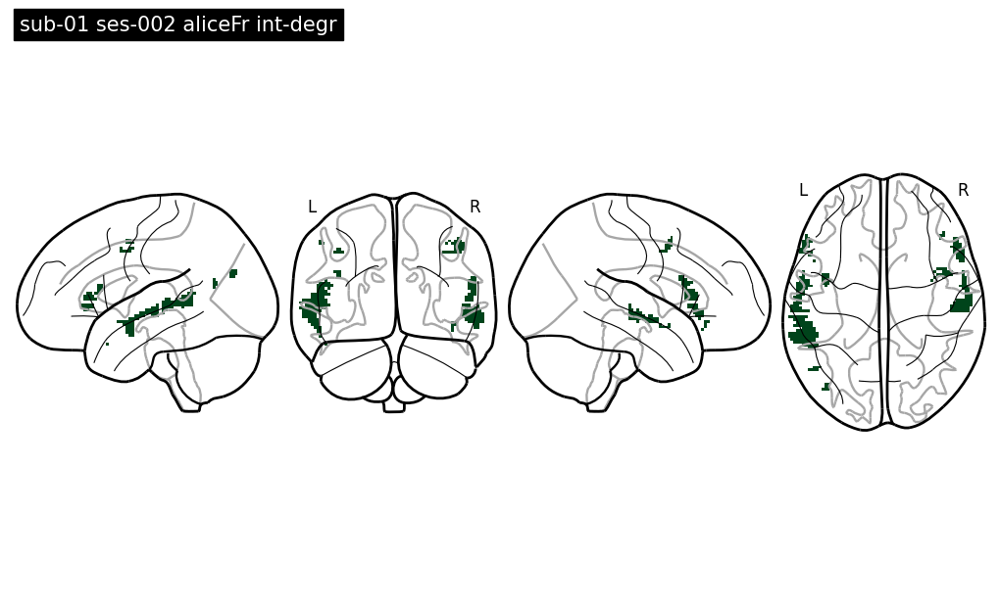

<Figure size 1000x600 with 0 Axes>

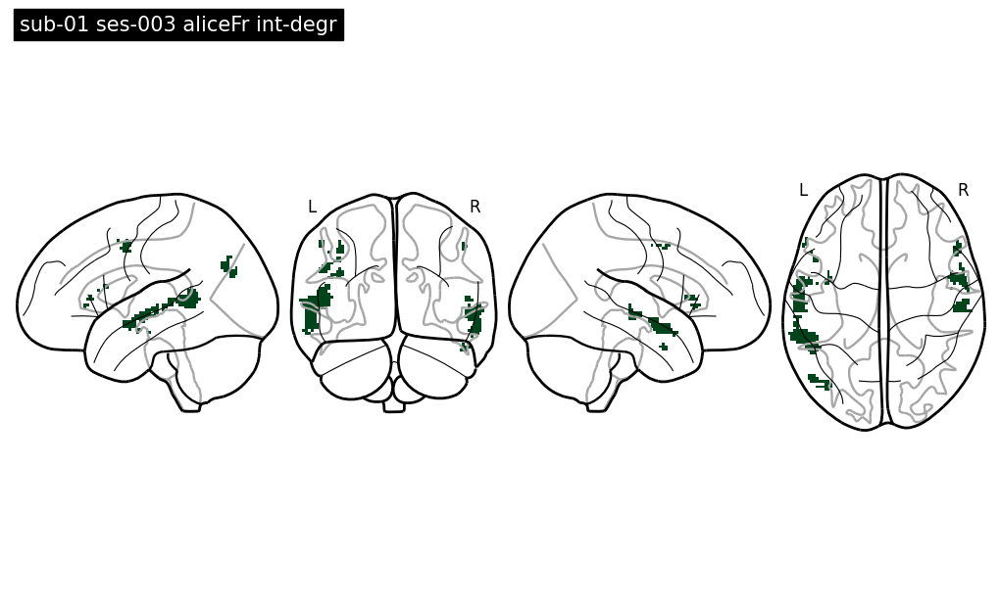

<Figure size 1000x600 with 0 Axes>

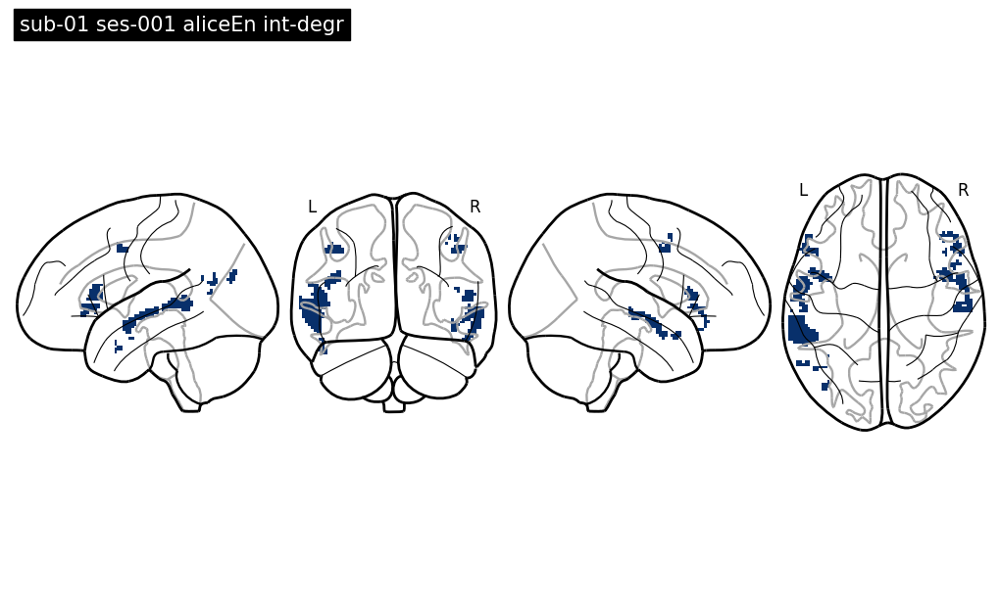

<Figure size 1000x600 with 0 Axes>

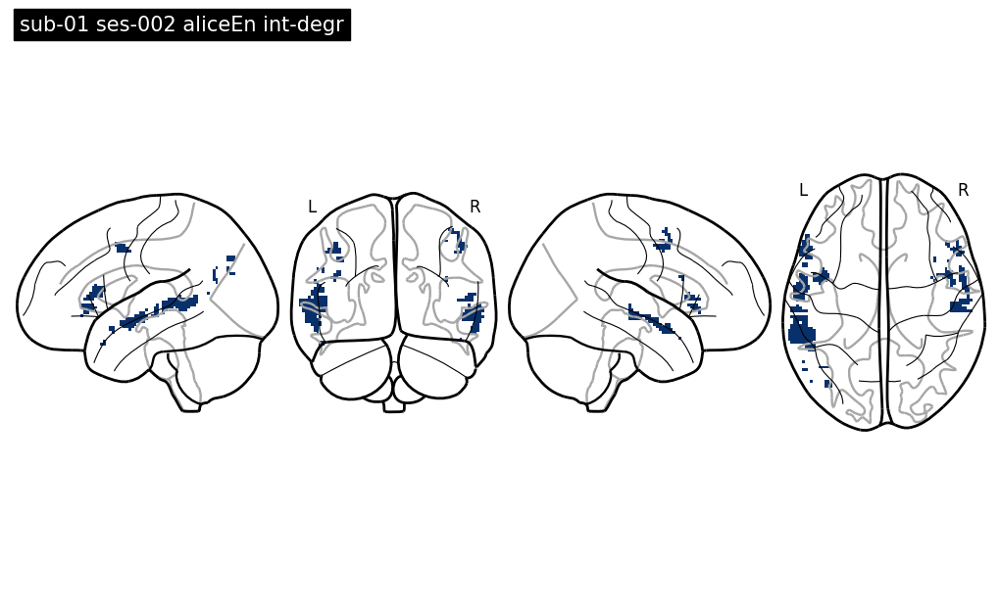

<Figure size 1000x600 with 0 Axes>

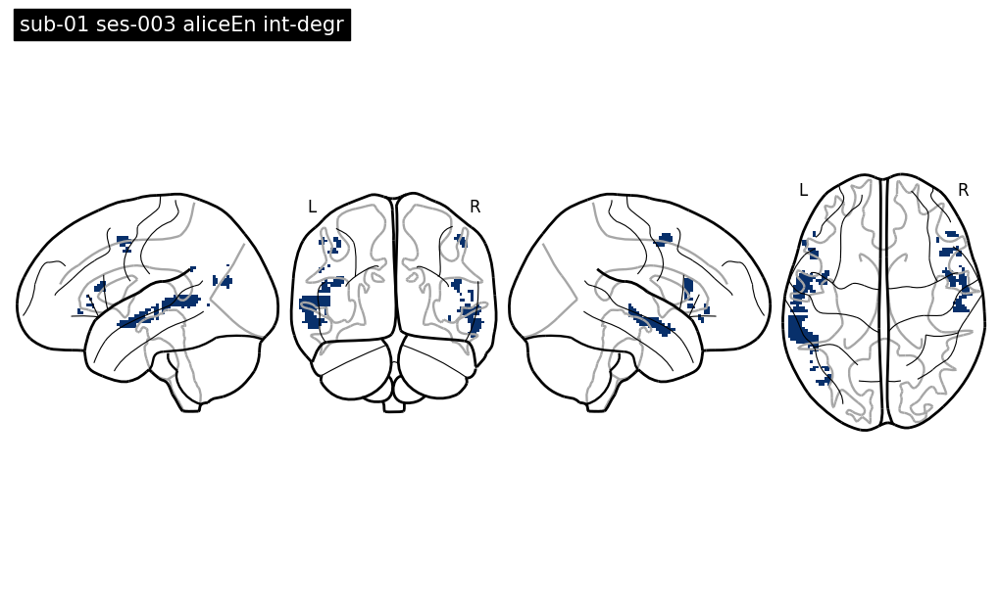

<Figure size 1000x600 with 0 Axes>

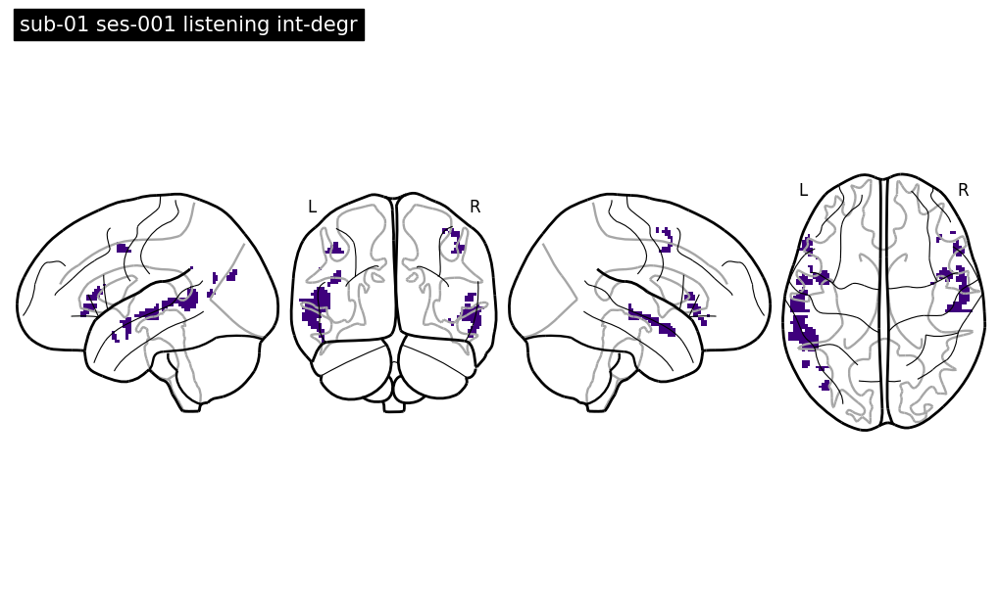

<Figure size 1000x600 with 0 Axes>

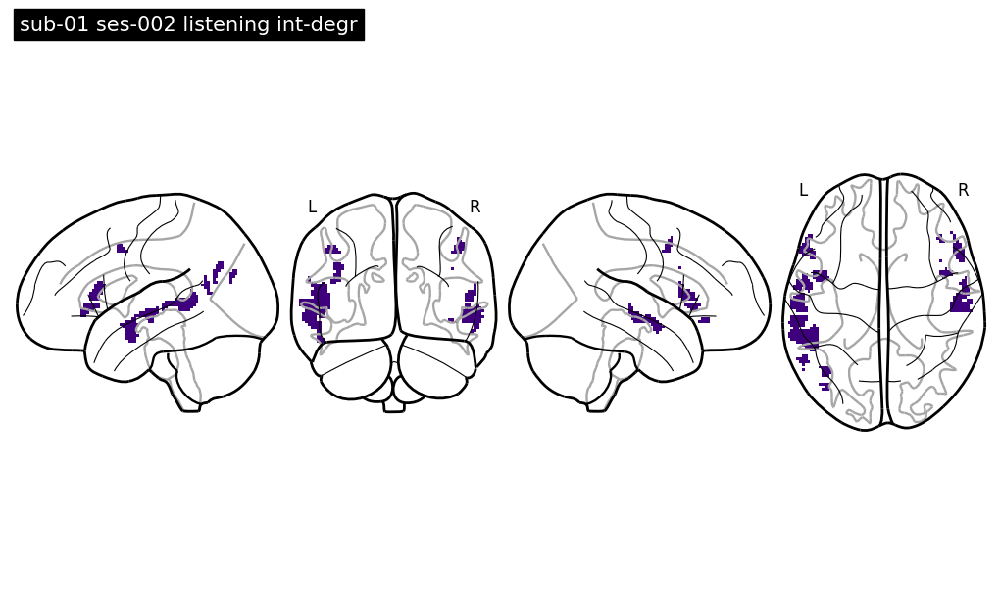

<Figure size 1000x600 with 0 Axes>

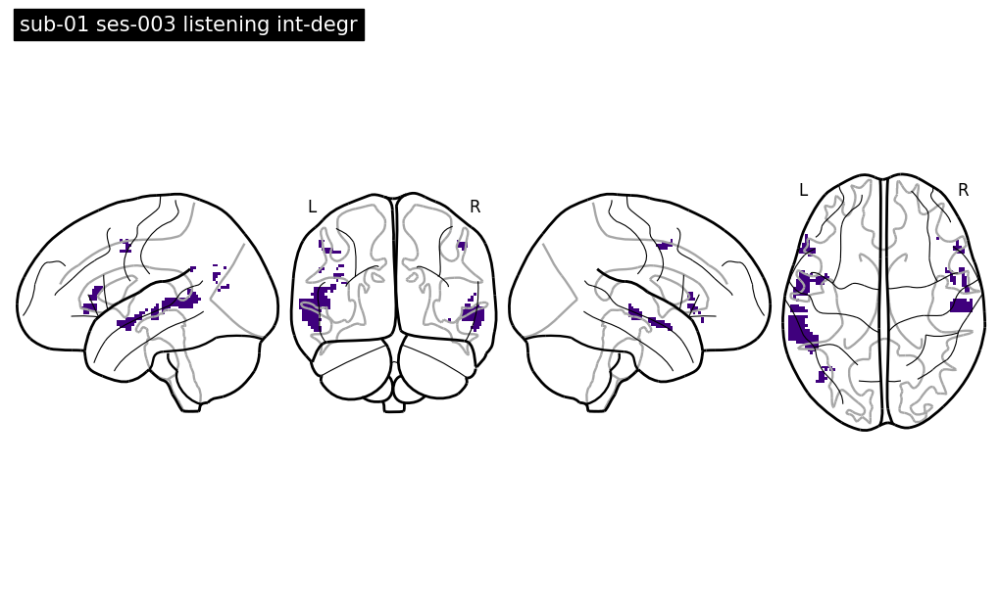

<Figure size 1000x600 with 0 Axes>

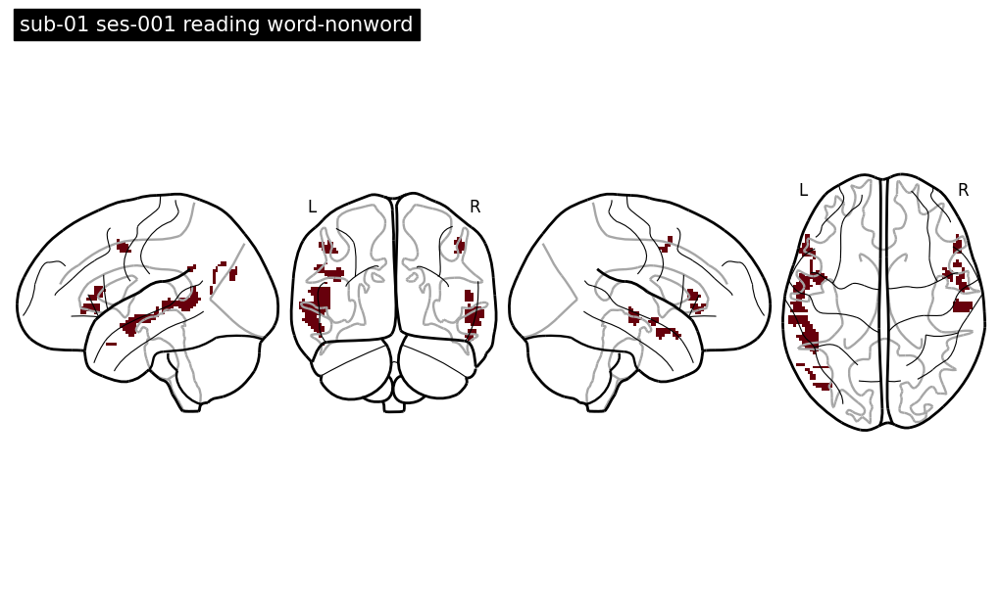

<Figure size 1000x600 with 0 Axes>

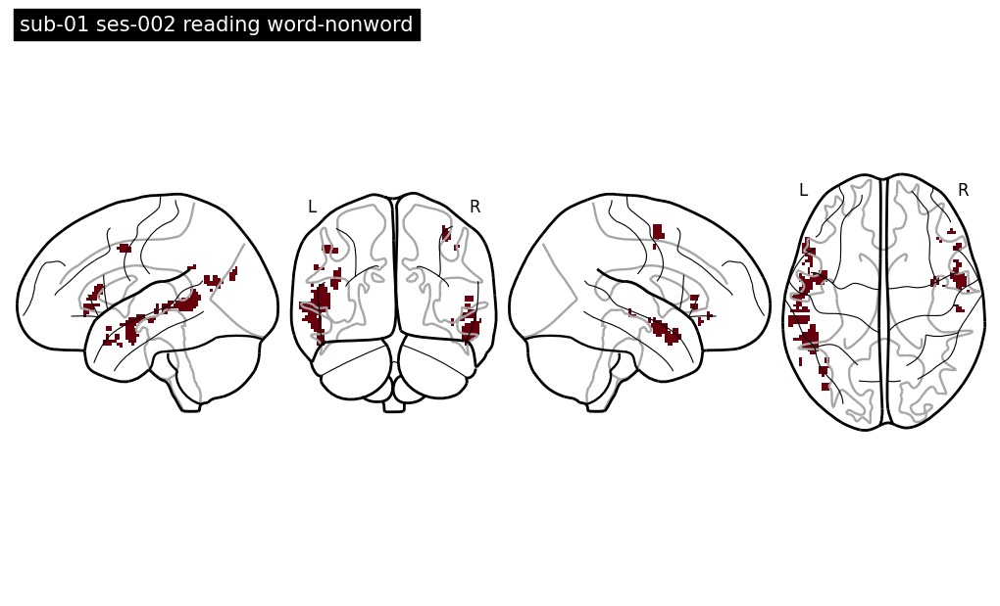

<Figure size 1000x600 with 0 Axes>

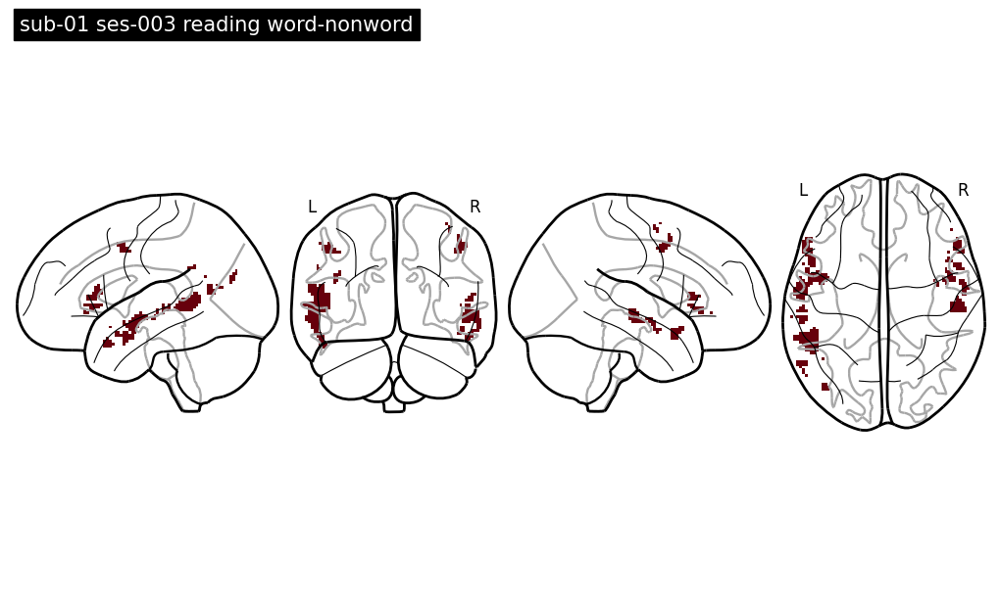

<Figure size 1000x600 with 0 Axes>

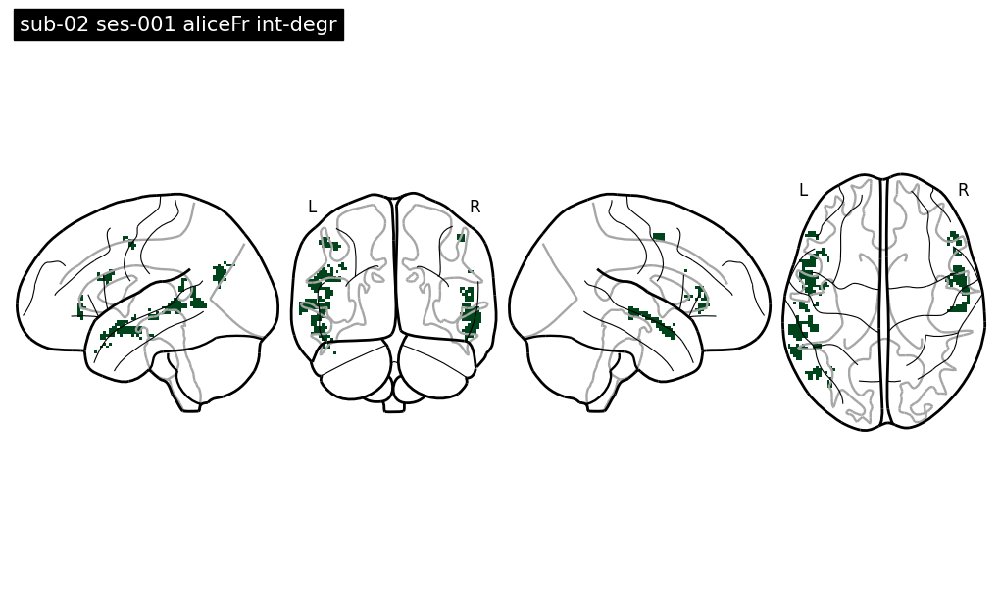

<Figure size 1000x600 with 0 Axes>

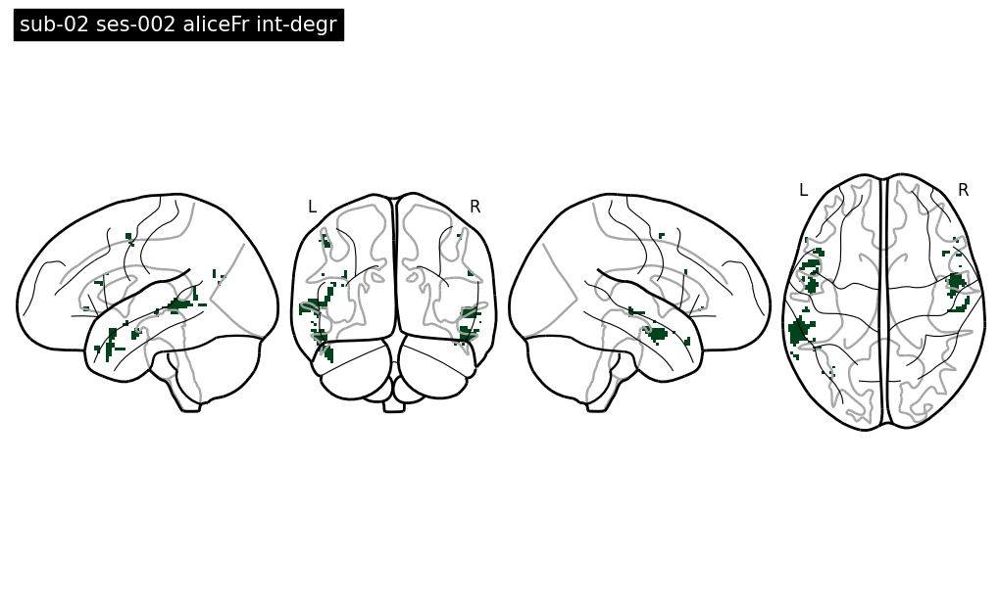

<Figure size 1000x600 with 0 Axes>

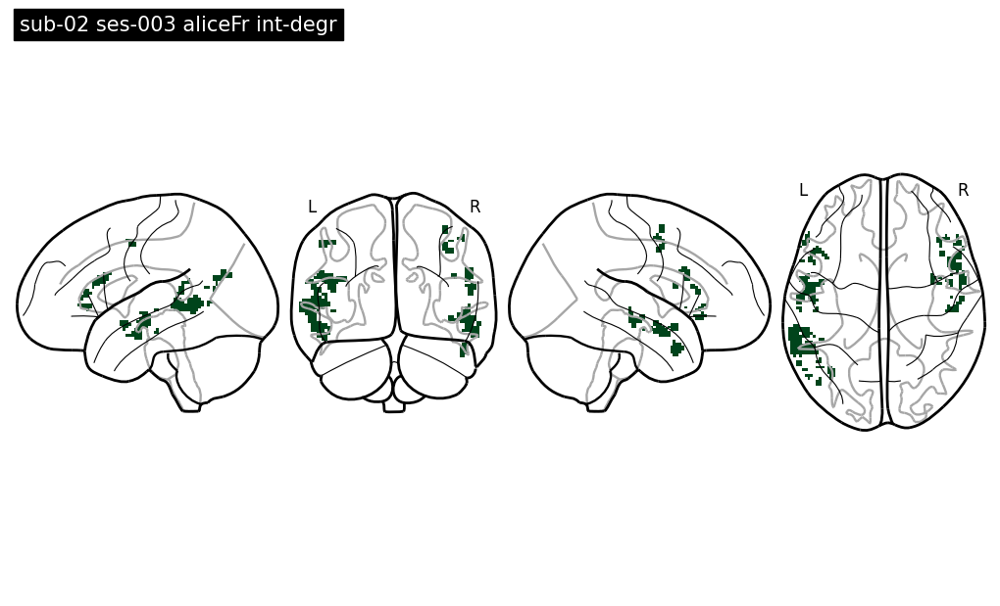

<Figure size 1000x600 with 0 Axes>

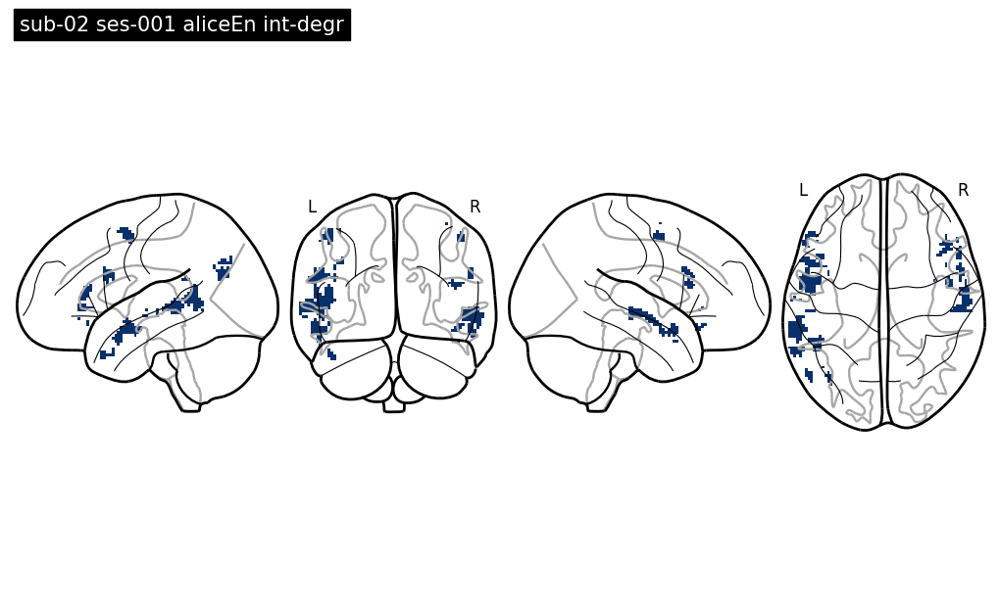

<Figure size 1000x600 with 0 Axes>

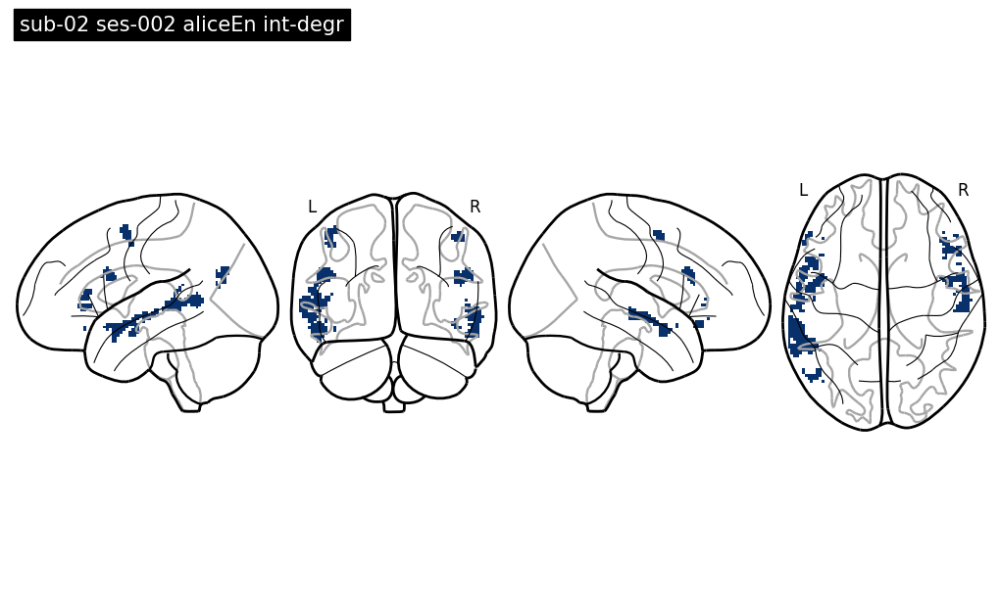

<Figure size 1000x600 with 0 Axes>

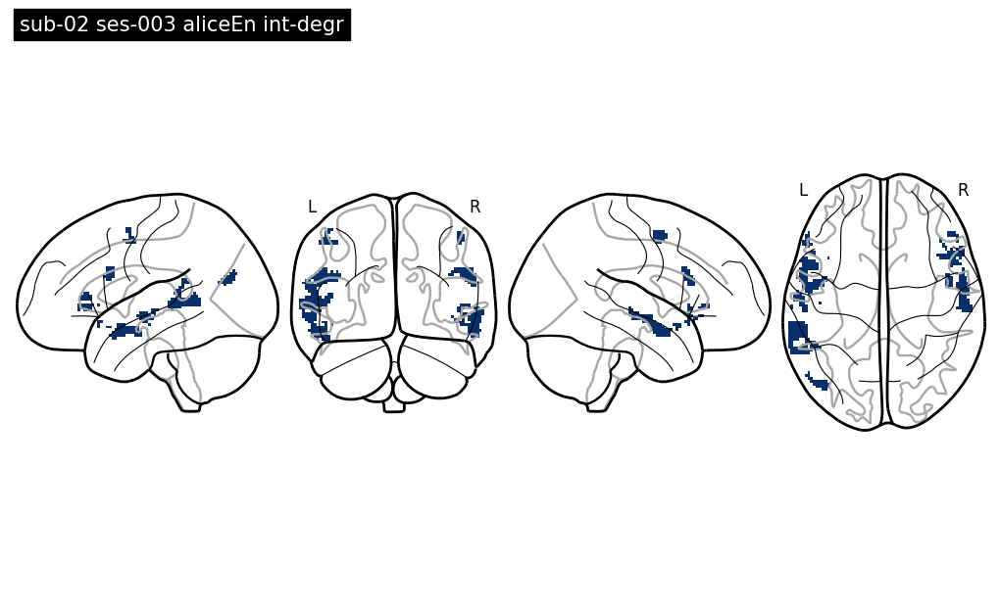

<Figure size 1000x600 with 0 Axes>

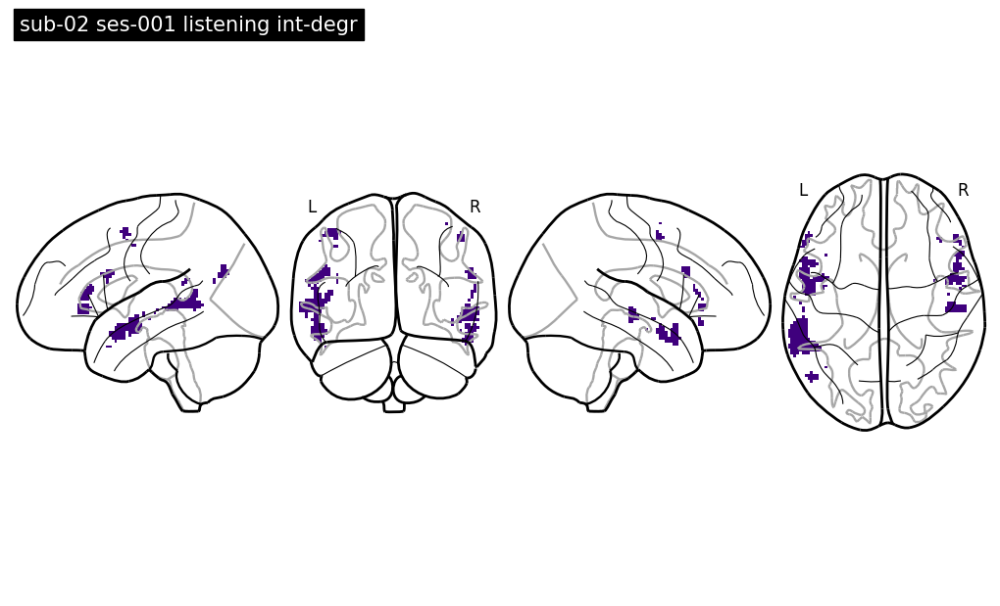

<Figure size 1000x600 with 0 Axes>

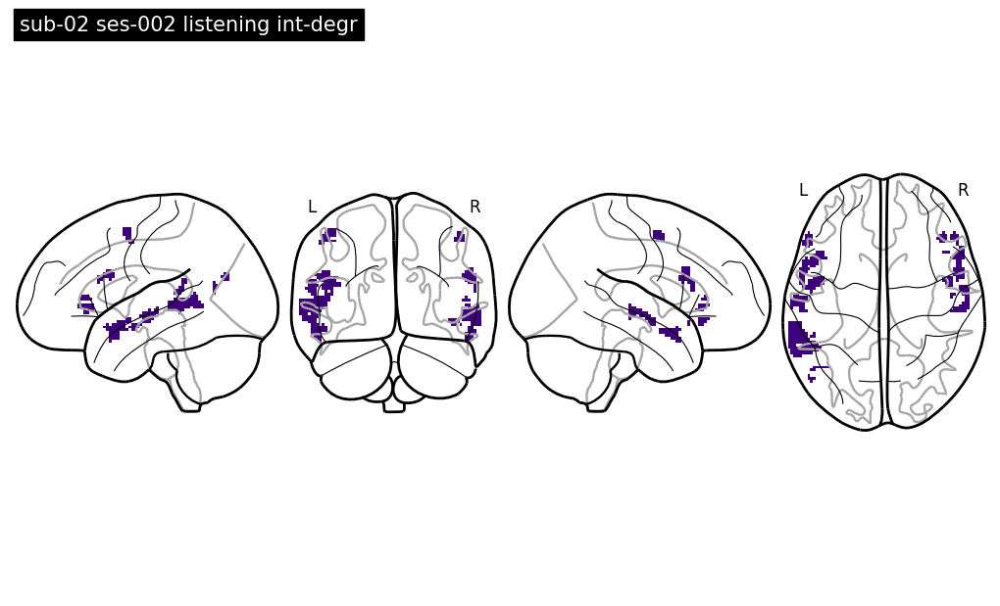

<Figure size 1000x600 with 0 Axes>

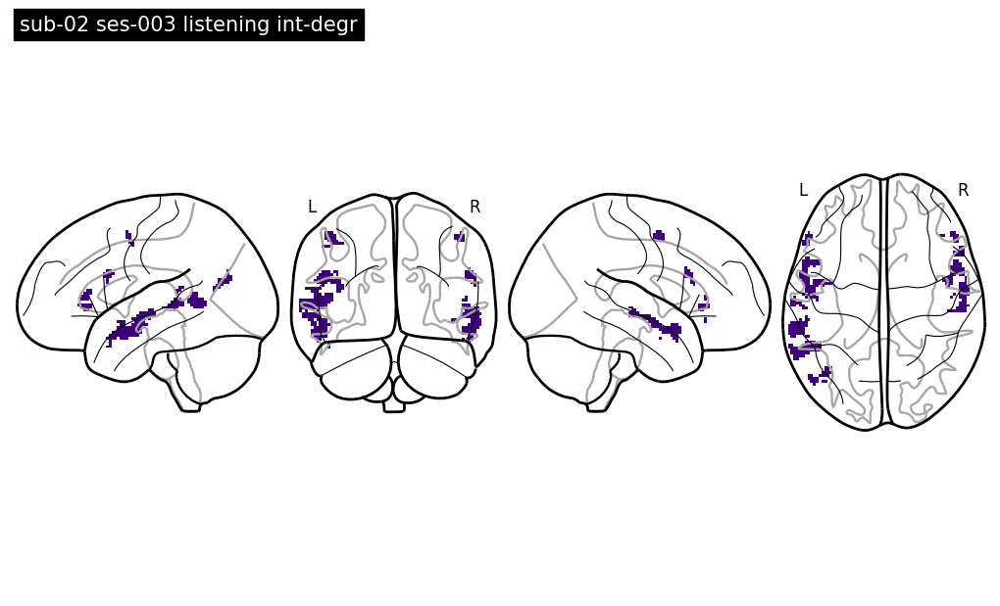

<Figure size 1000x600 with 0 Axes>

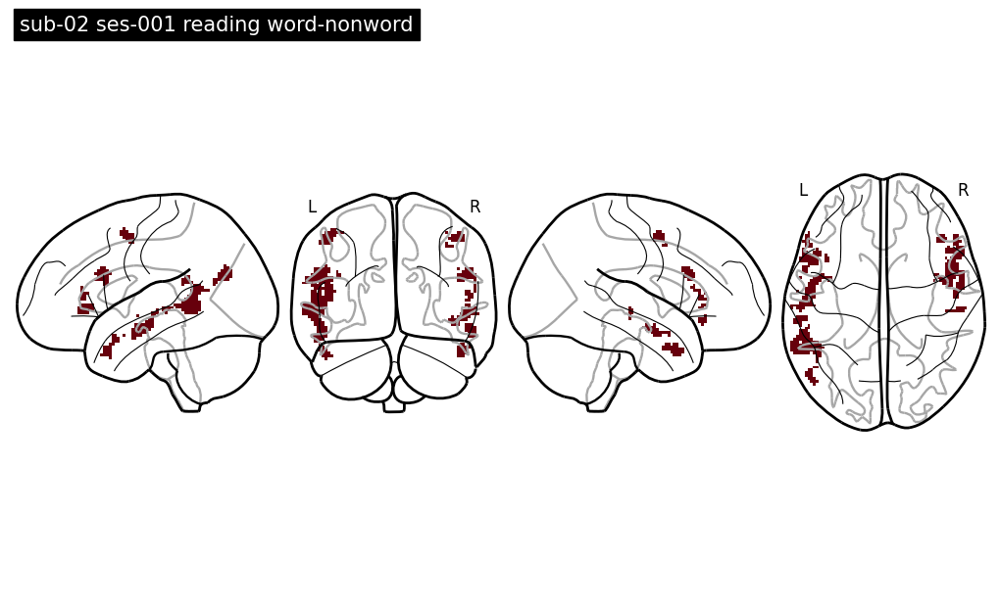

<Figure size 1000x600 with 0 Axes>

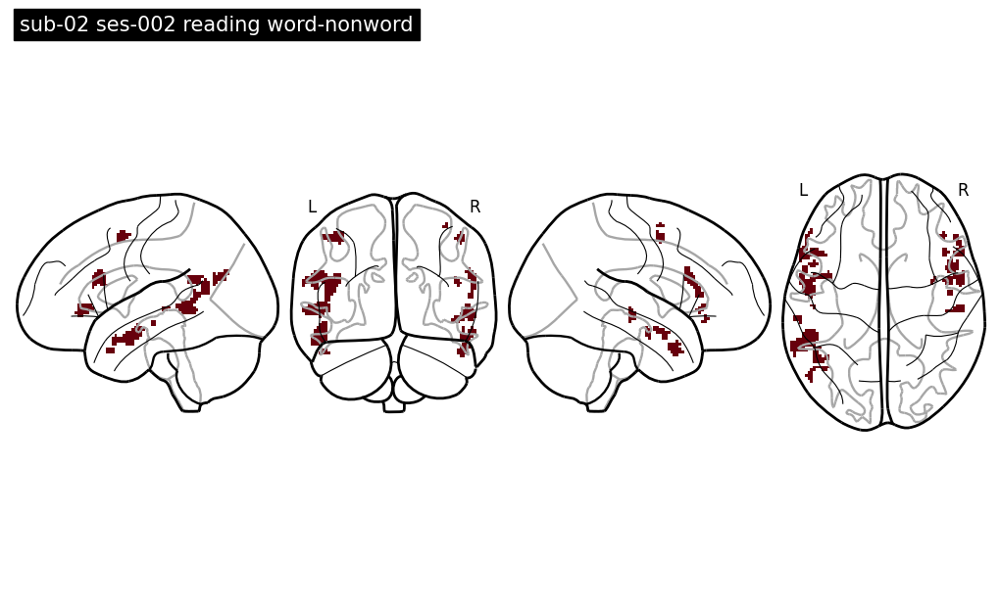

<Figure size 1000x600 with 0 Axes>

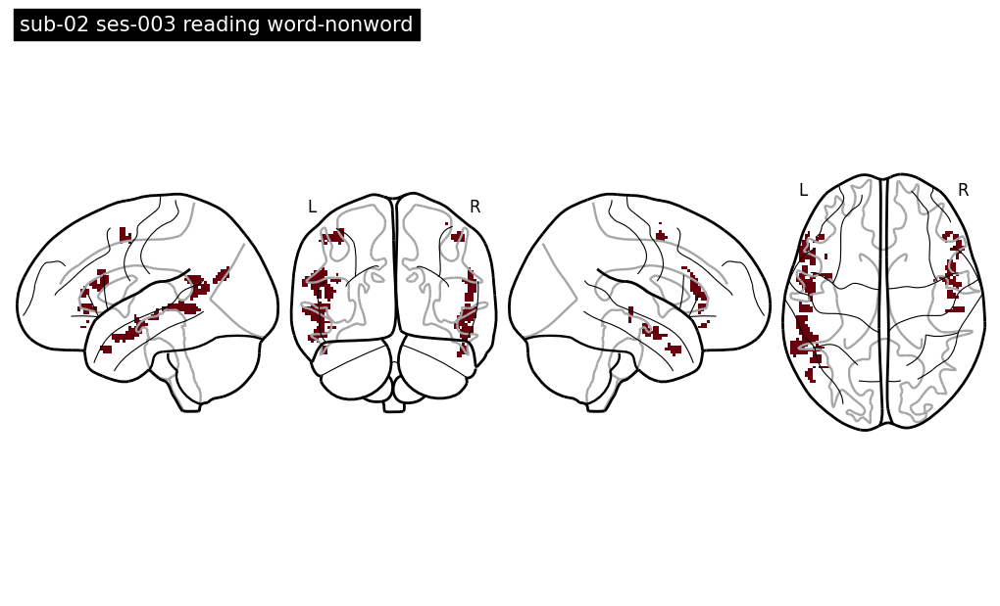

<Figure size 1000x600 with 0 Axes>

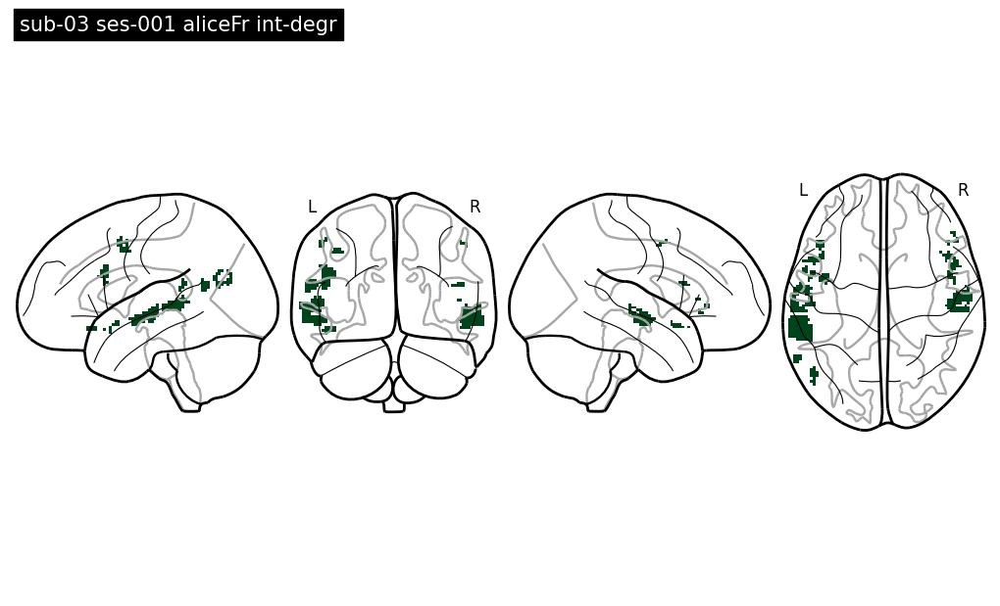

<Figure size 1000x600 with 0 Axes>

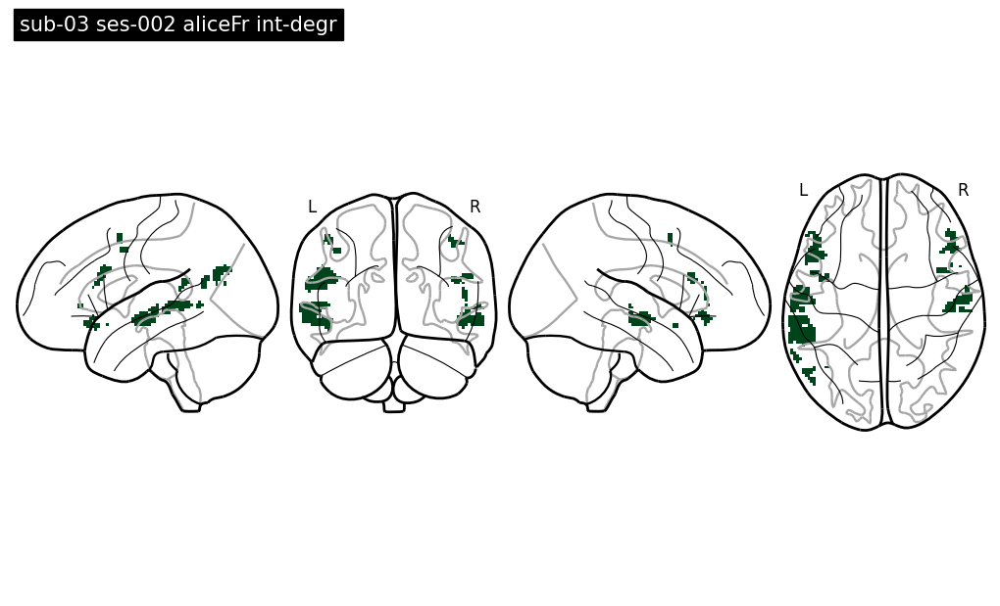

<Figure size 1000x600 with 0 Axes>

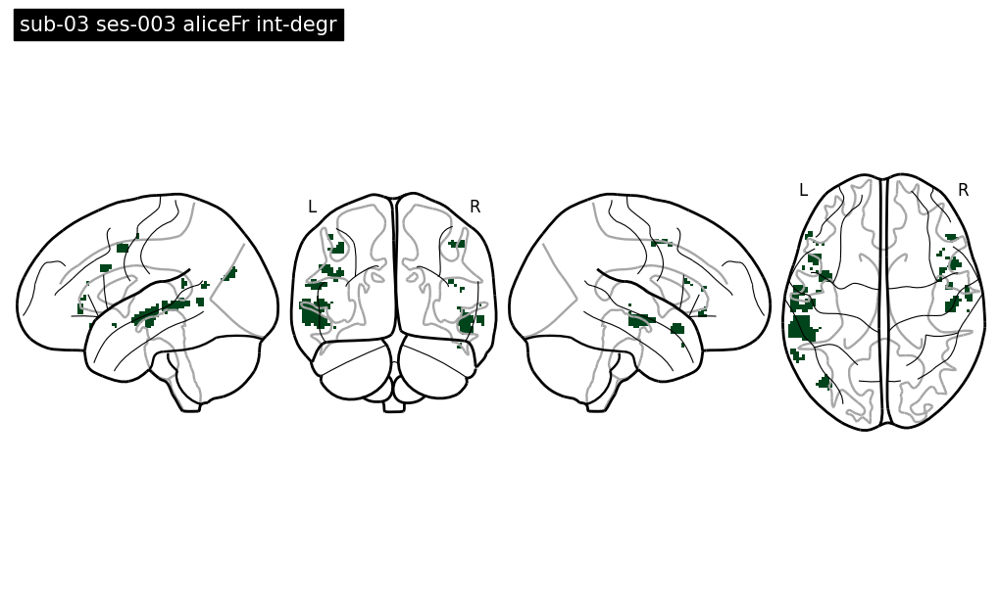

<Figure size 1000x600 with 0 Axes>

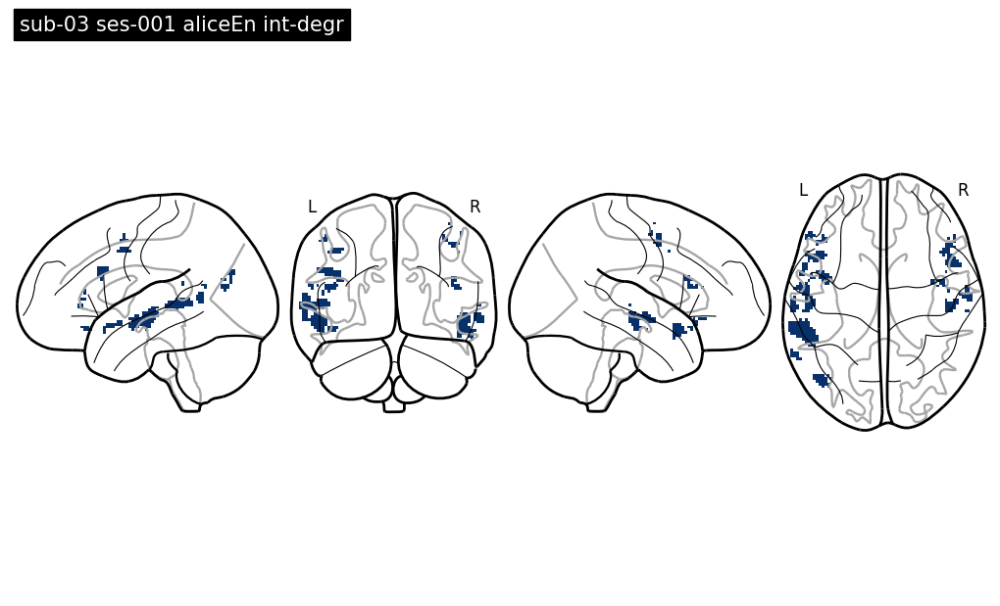

<Figure size 1000x600 with 0 Axes>

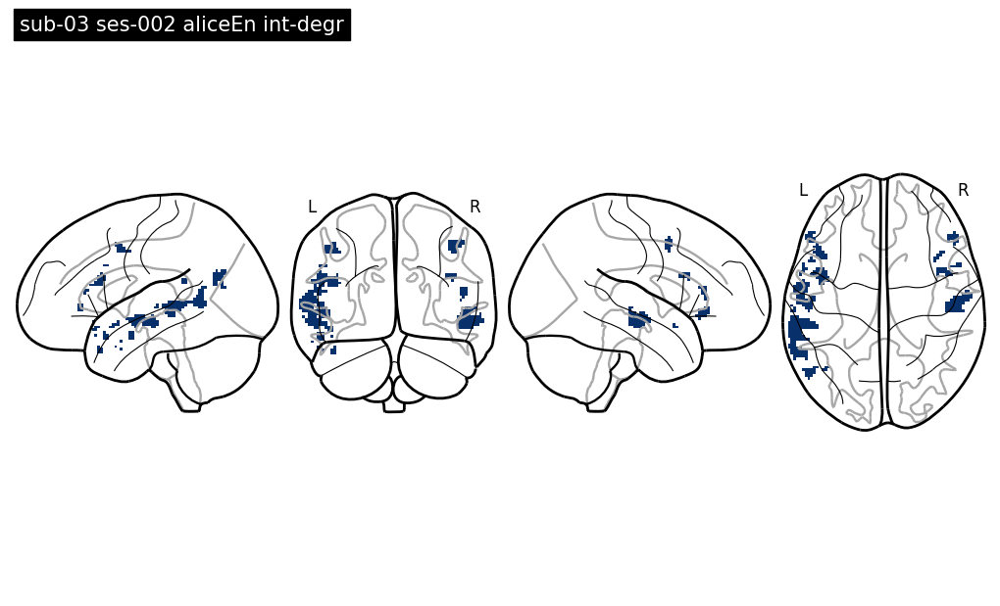

<Figure size 1000x600 with 0 Axes>

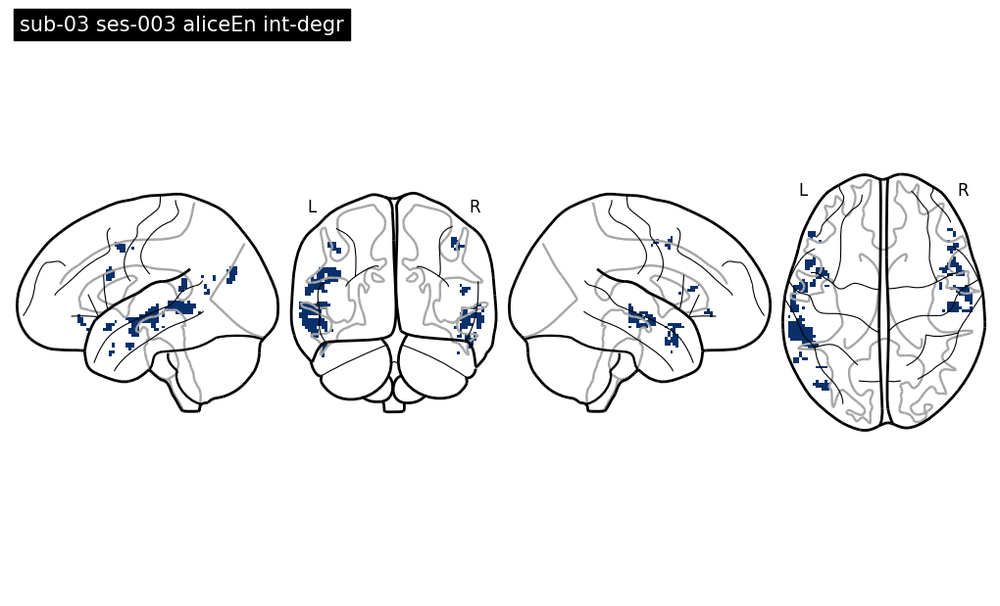

<Figure size 1000x600 with 0 Axes>

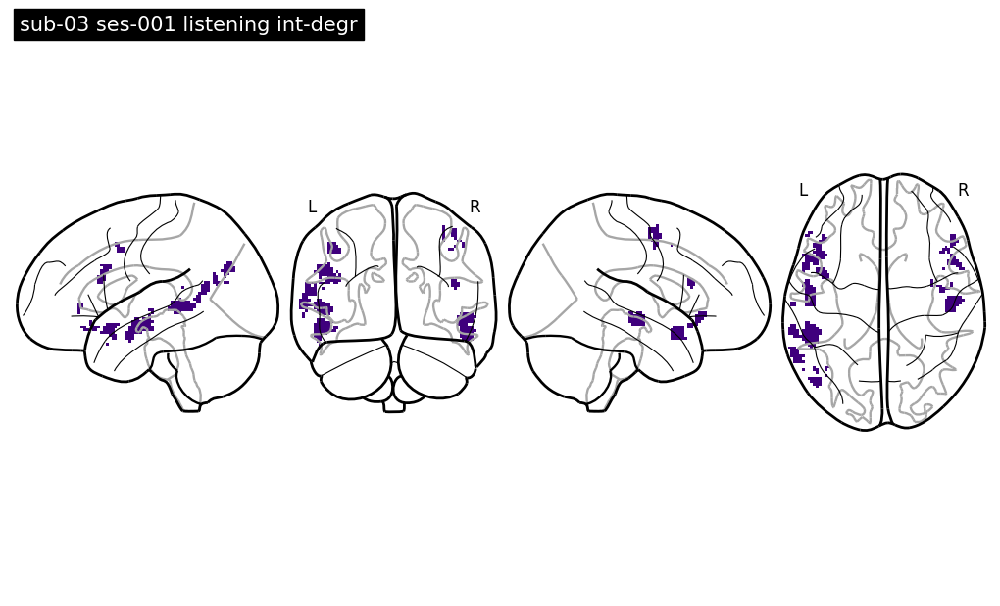

<Figure size 1000x600 with 0 Axes>

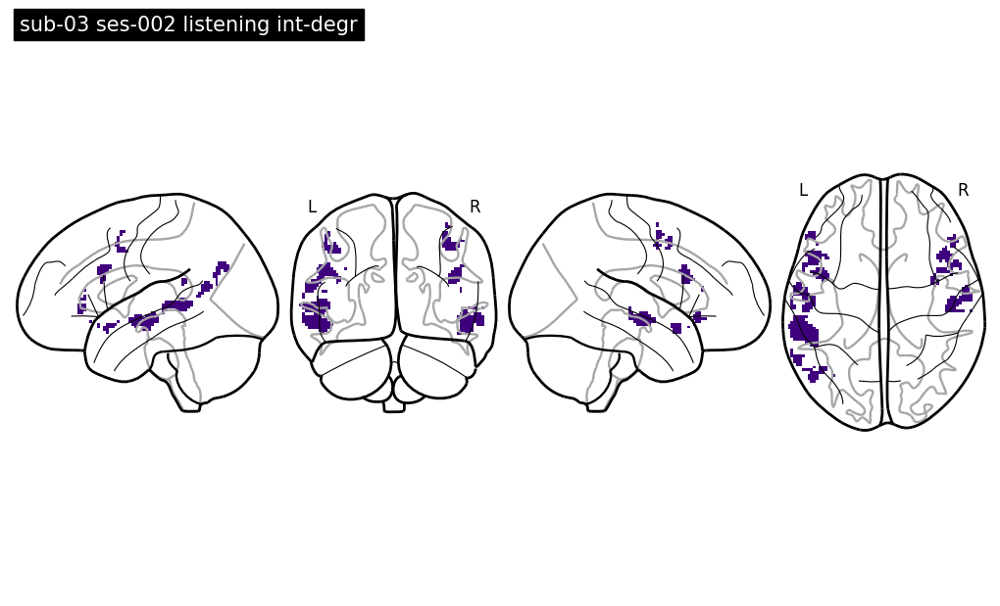

<Figure size 1000x600 with 0 Axes>

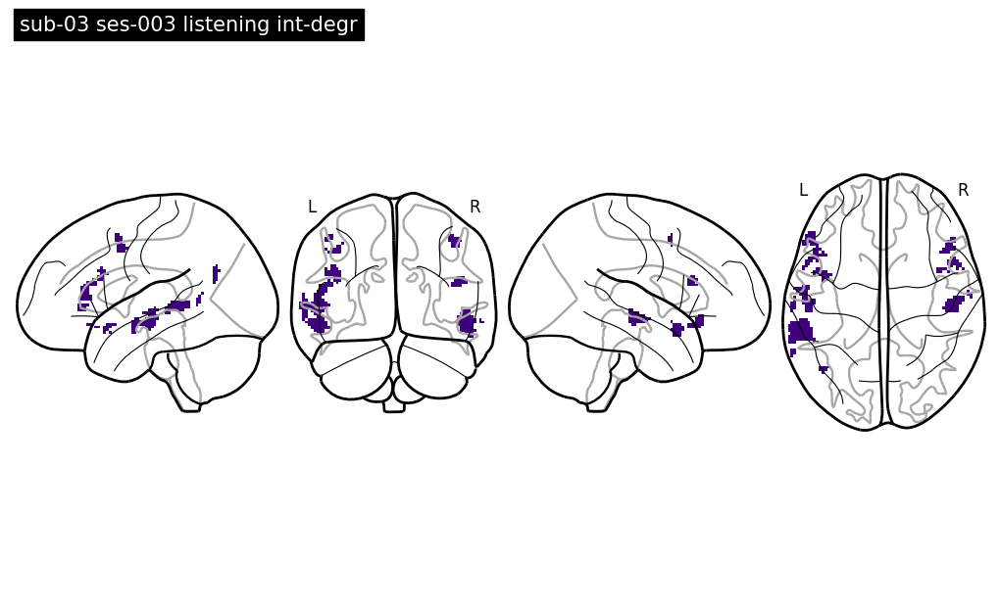

<Figure size 1000x600 with 0 Axes>

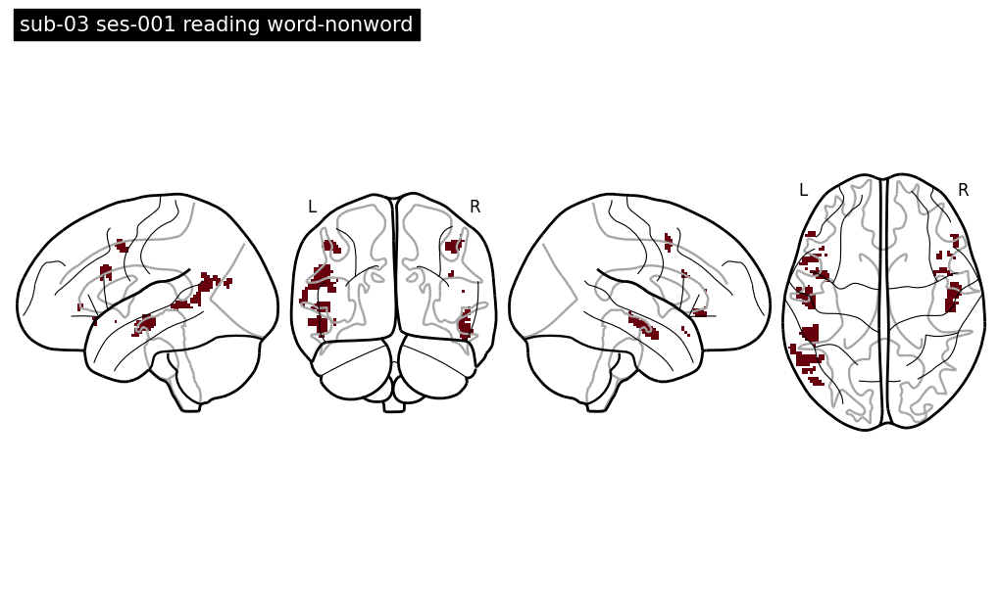

<Figure size 1000x600 with 0 Axes>

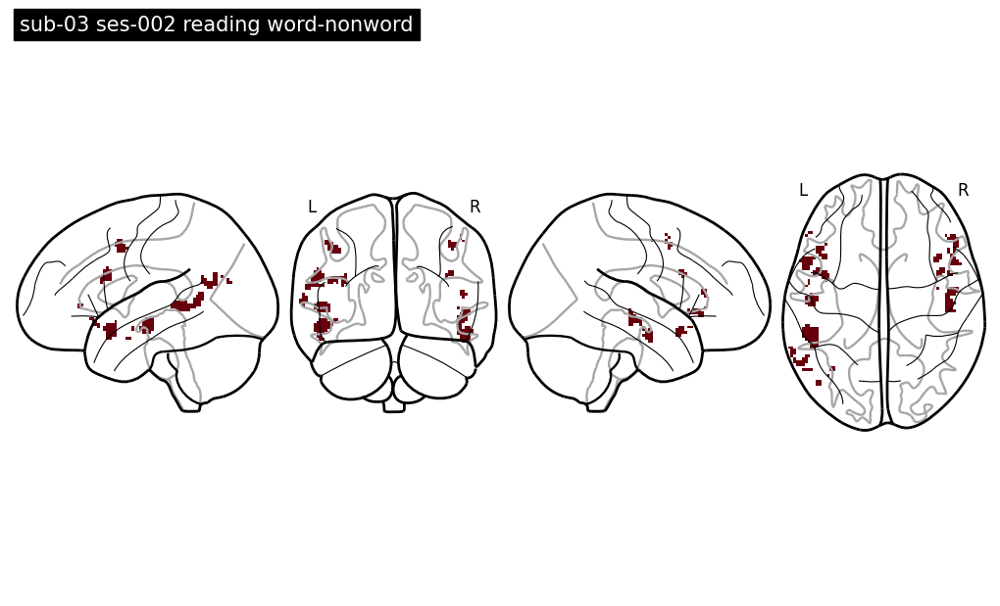

<Figure size 1000x600 with 0 Axes>

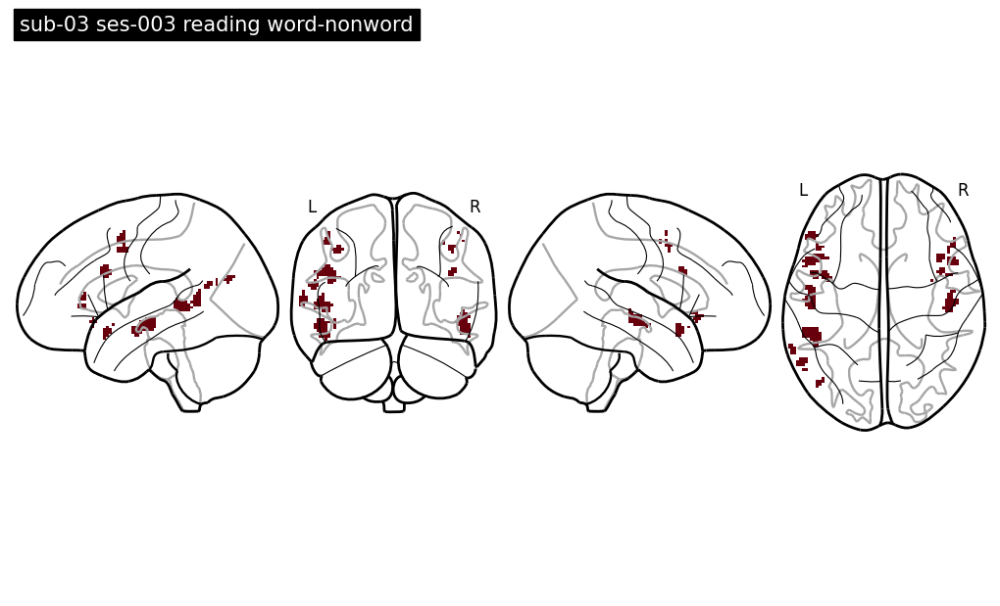

<Figure size 1000x600 with 0 Axes>

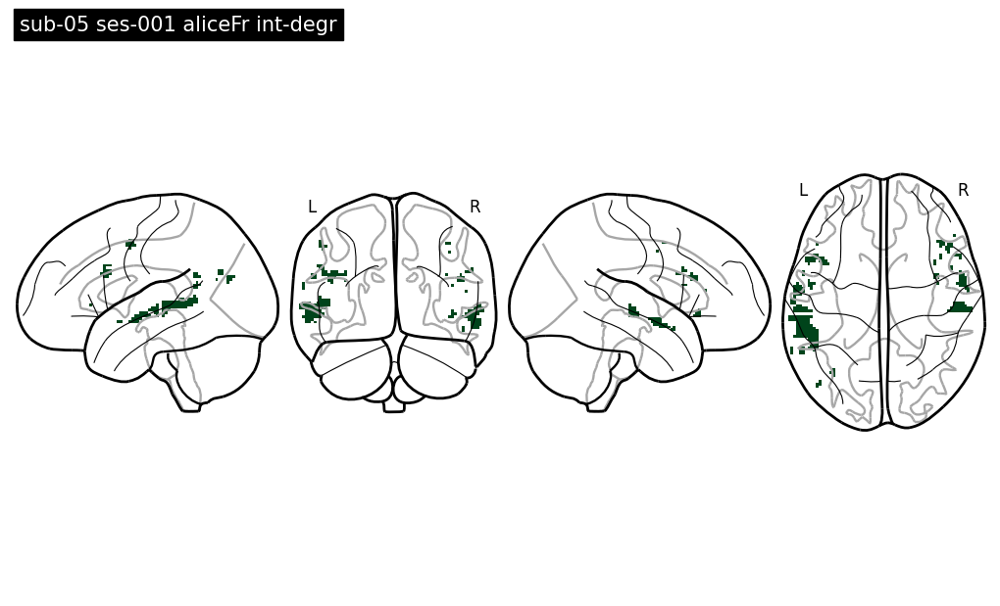

<Figure size 1000x600 with 0 Axes>

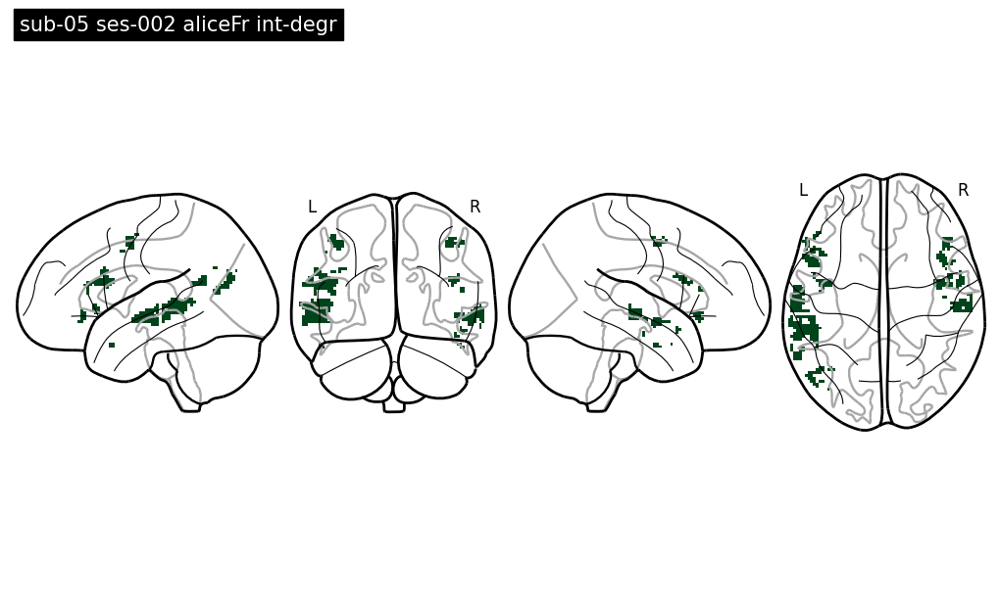

<Figure size 1000x600 with 0 Axes>

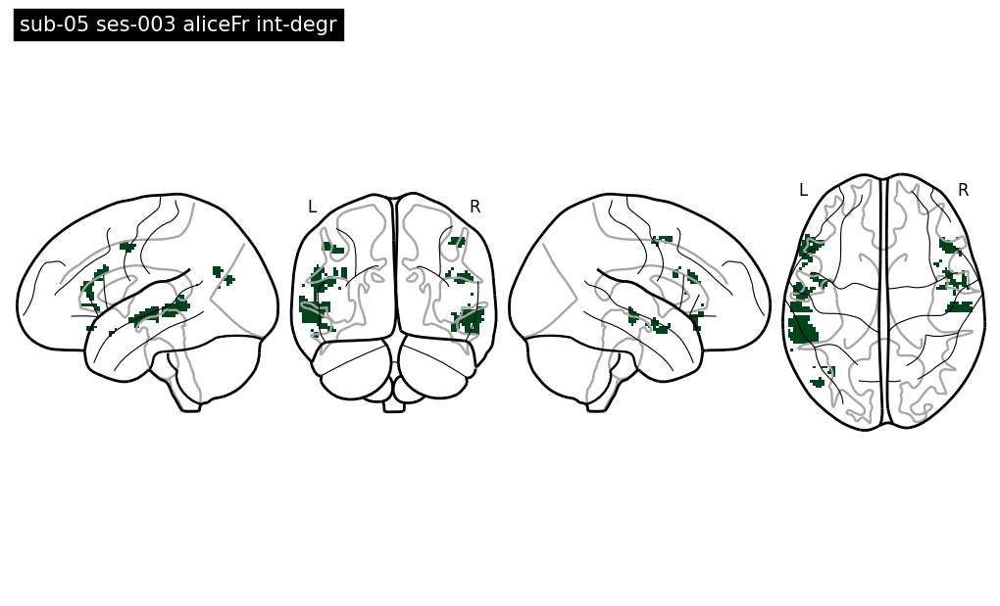

<Figure size 1000x600 with 0 Axes>

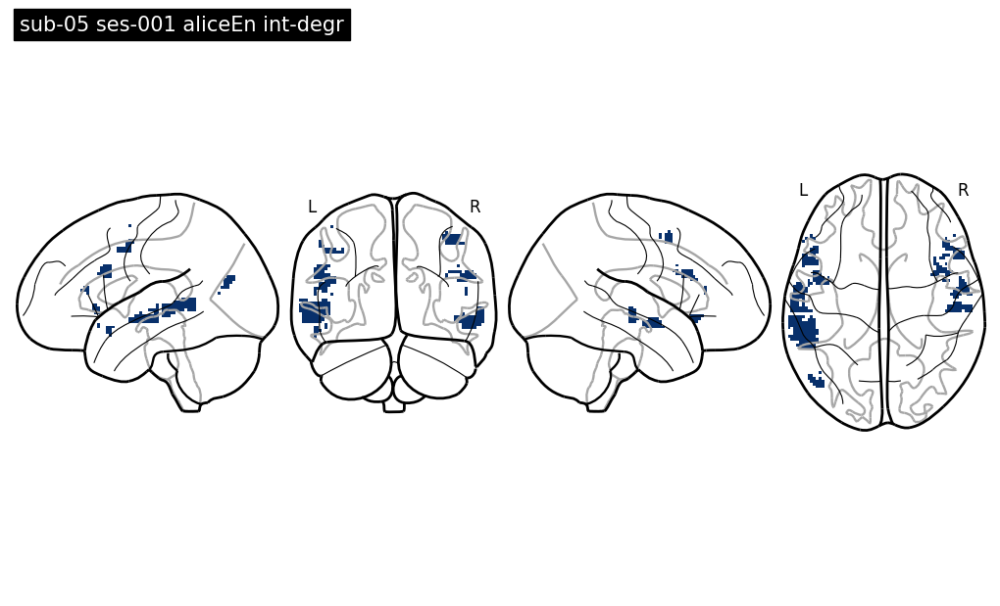

<Figure size 1000x600 with 0 Axes>

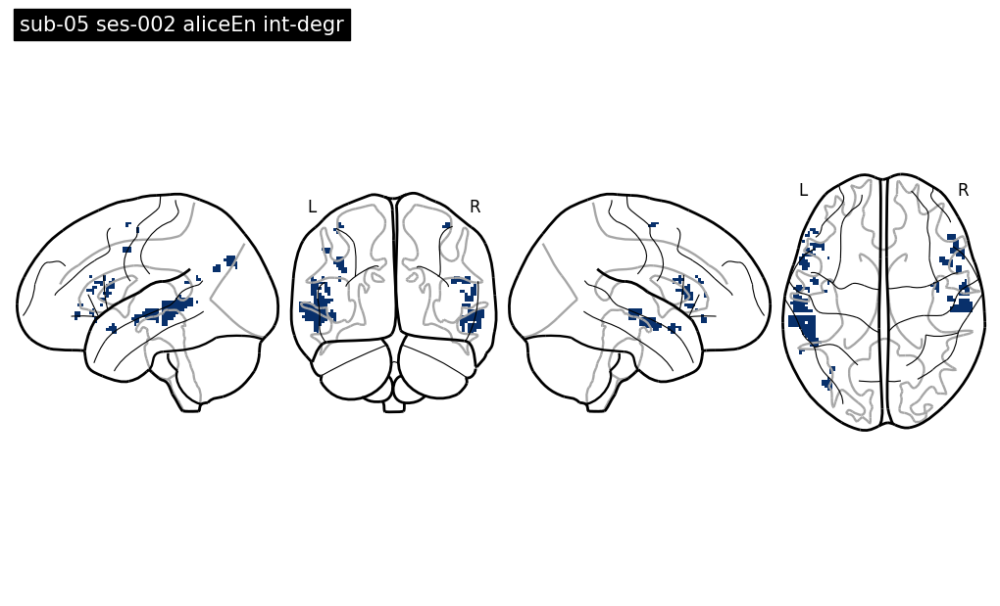

<Figure size 1000x600 with 0 Axes>

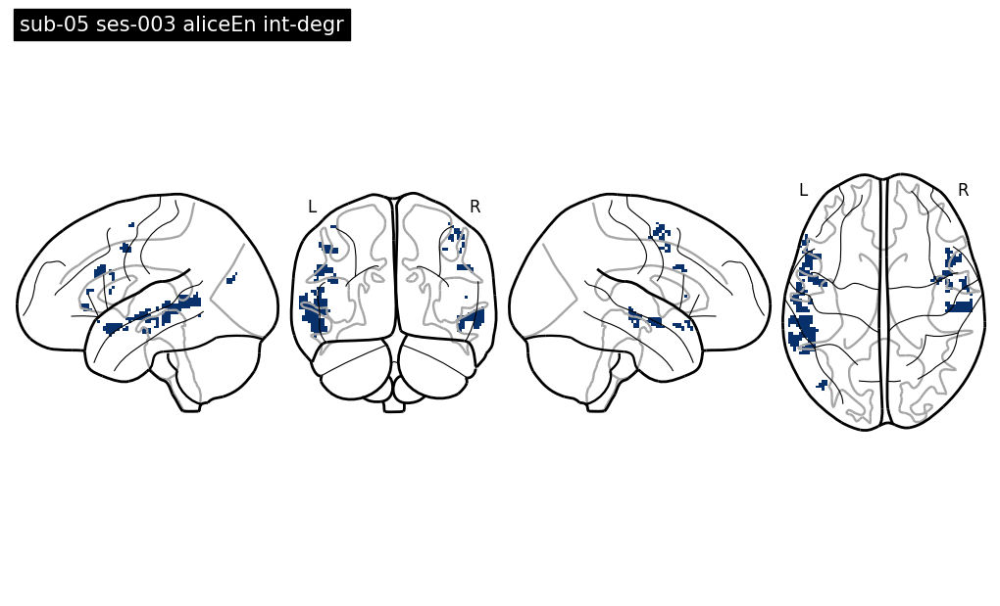

<Figure size 1000x600 with 0 Axes>

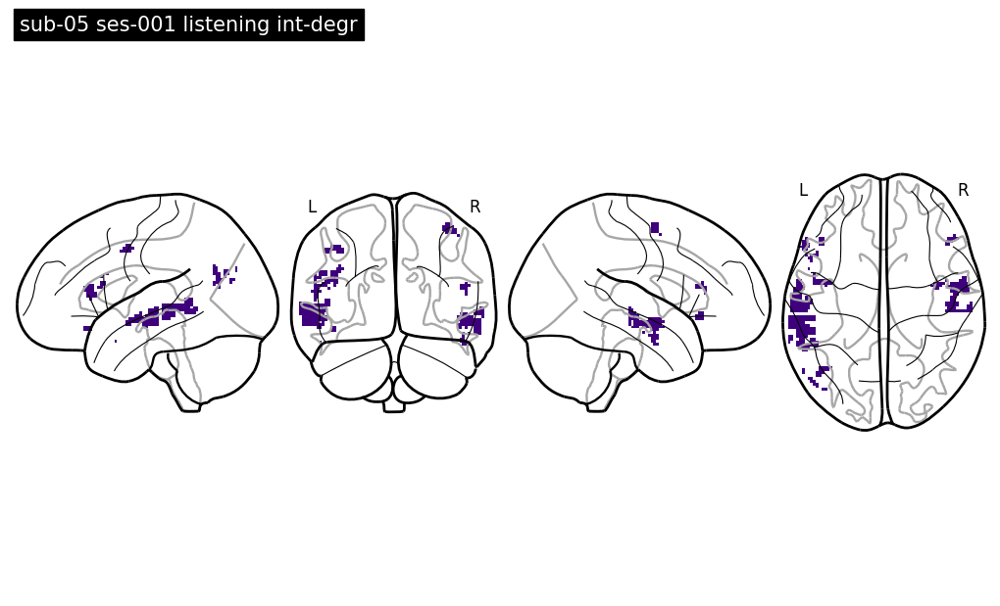

<Figure size 1000x600 with 0 Axes>

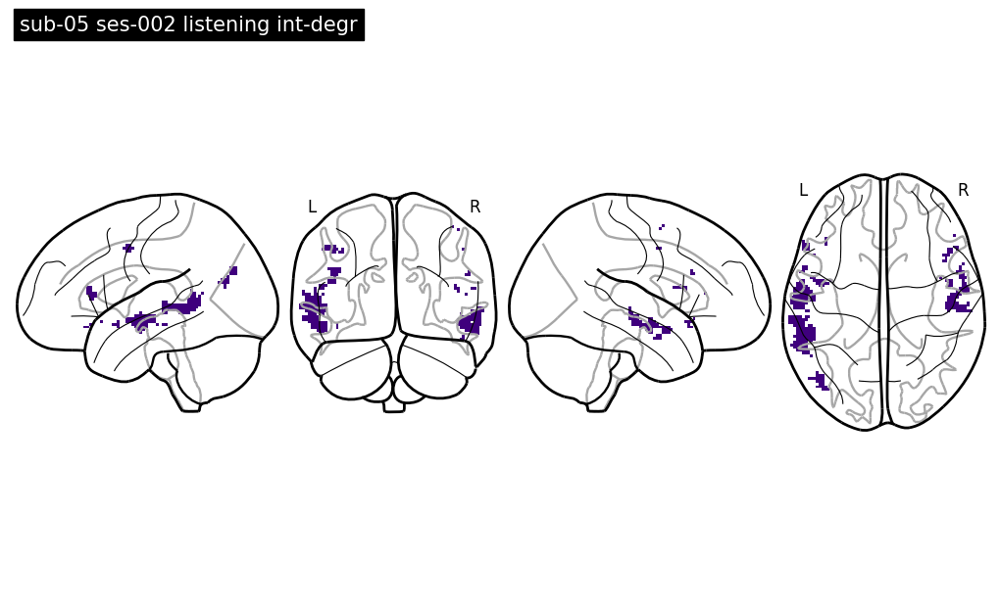

<Figure size 1000x600 with 0 Axes>

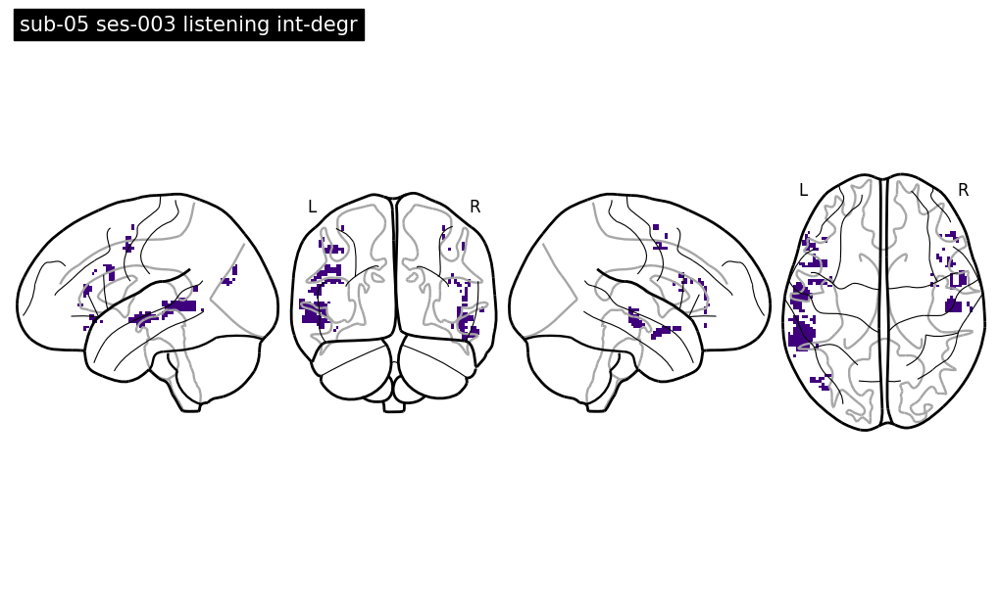

<Figure size 1000x600 with 0 Axes>

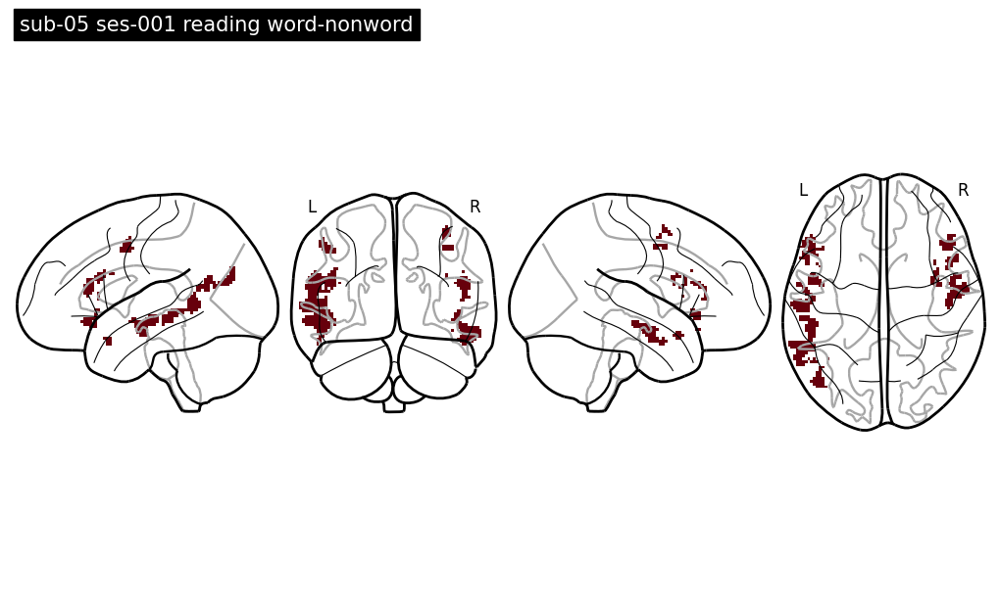

<Figure size 1000x600 with 0 Axes>

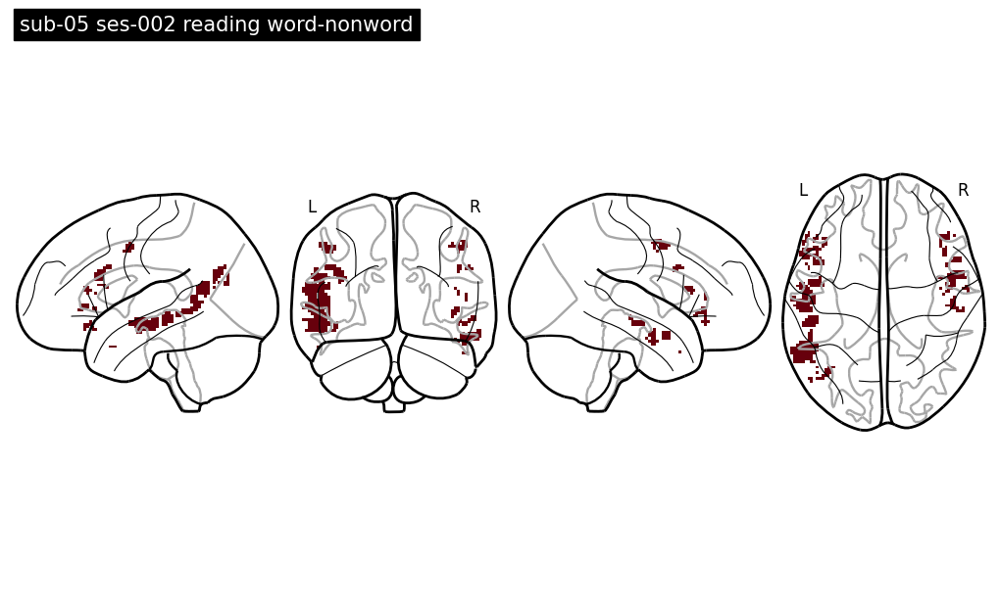

<Figure size 1000x600 with 0 Axes>

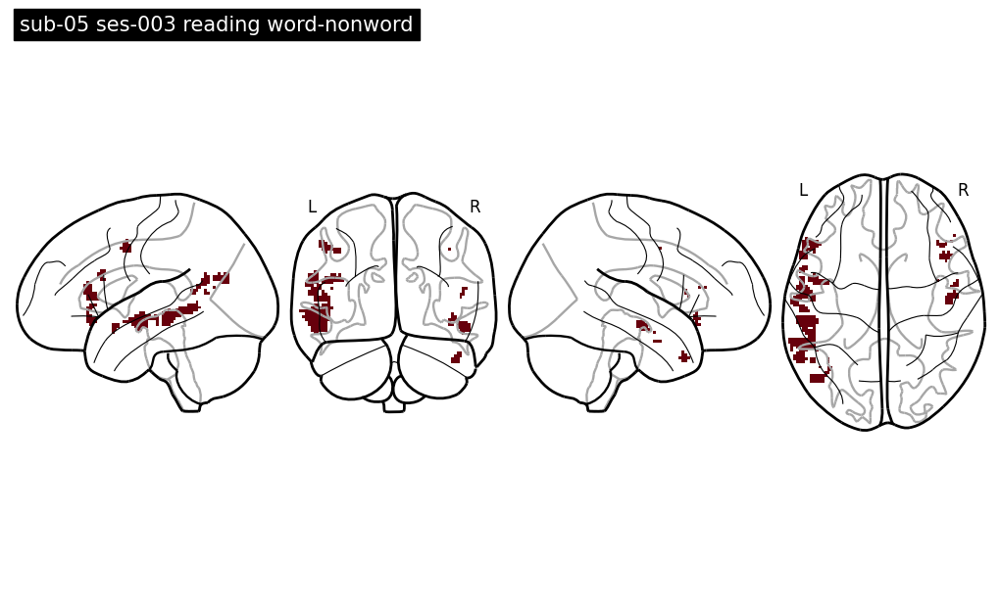

In [3]:
# Collect All Data
"""
Extract ROI data from Language Localizer tasks only
"""
from pathlib import Path
import numpy as np
import pandas as pd
import nibabel as nib
from nilearn.image import resample_to_img


TOP_PERCENT = 0.10  # Top 10%
TOP_VOXELS = 10
print(f"Top {int(TOP_PERCENT*100)}% voxels per parcel")
# =============================================================================
# CONFIGURATION
# =============================================================================

SUBJECTS = ["sub-01", "sub-02", "sub-03", "sub-05"]


def build_alllang_mask(mask_files, union=True):
    """Merge multiple parcel masks into one."""
    if not mask_files:
        raise ValueError("No mask files provided")
    
    template_img = nib.load(str(mask_files[0]))
    template_data = template_img.get_fdata()
    merged = np.zeros_like(template_data, dtype=np.int16)
    
    for idx, mf in enumerate(sorted(mask_files), start=1):
        m = nib.load(str(mf)).get_fdata() > 0
        merged[m] = 1 if union else idx
    
    return nib.Nifti1Image(merged, template_img.affine, template_img.header)

print("="*80)
print("CREATING SESSION-LEVEL allLANG MASKS")
print("="*80)


for subject in SUBJECTS:
    for task, contrast_list in TASK_CONTRASTS.items():
        cmap = TASK_COLORMAPS[task]
        
        for contrast in contrast_list:
            # Find all session-specific parcel masks
            pattern = f"{subject}_ses-*_task-{task}_contrast-{contrast}_parcel-*_top{TOP_VOXELS}.nii.gz"
            session_files = sorted(OUT_DIR.glob(pattern))
            
            if not session_files:
                print(f"[WARN] No session masks for {subject}/{task}/{contrast}")
                continue
            # Group by session
            groups = defaultdict(list)
            for f in session_files:
                parts = f.name.split("_")
                ses_part = next(p for p in parts if p.startswith("ses-"))
                groups[ses_part].append(f)
            # Group by session
          
            print(f"\n{subject} / {task} / {contrast}")
            for session, files in groups.items():
               
                # Save NIfTI
                out_nii = allLANG_MASK_DIR / (
                    f"{subject}_{session}_task-{task}_contrast-{contrast}_"
                    f"allLANG_top{TOP_VOXELS}_union.nii.gz"
                )
                allmask_img = nib.load(out_nii)
                
                # Create figure
                fig = plt.figure(figsize=(10, 6))
                # Create figure
                fig = plt.figure(figsize=(10, 6))
                display = plotting.plot_glass_brain(
                    allmask_img,
                    cmap=cmap,
                    bg_img=None,
                    black_bg=False,
                    plot_abs=False,
                    colorbar=False,
                    display_mode="lyrz",
                    threshold=0.1,
                    alpha=1.0,
                    vmax=1,
                    title=f"{subject} {session} {task} {contrast}",
                    figure=fig
                )
                
                # ── FIXED: use fig directly, not display.figure ──────────────────
                fig.patch.set_facecolor("white")
                for ax_obj in fig.get_axes():
                    ax_obj.set_facecolor("none")
                    ax_obj.patch.set_alpha(0.0)
                
                # Save figure
                fig_name = f"{subject}_{session}_task-{task}_contrast-{contrast}_{TOP_VOXELS}_allLANG.png"
                fig_path = allLANG_FIG_DIR / fig_name
                fig.savefig(fig_path, dpi=300, bbox_inches="tight", pad_inches=0.1)
                print(f"    ✓ Saved: {fig_path.name}")
    
                # display.close()   # ← close nilearn display object
                # plt.close(fig)    # ← close matplotlib figure

print("\n" + "="*80)
print("SESSION-LEVEL allLANG MASKS COMPLETE")
print("="*80)
print(f"Masks: {OUT_DIR}")
print(f"Figures: {FIG_DIR}")




PART 2: CREATING ACROSS-SESSION fROI MASKS

sub-01:
------------------------------------------------------------
  aliceFr     : Unioning 3 sessions
                → Saved: sub-01_task-aliceFr_contrast-int-degr_allLANG_across_sessions_10.png
  aliceEn     : Unioning 3 sessions
                → Saved: sub-01_task-aliceEn_contrast-int-degr_allLANG_across_sessions_10.png
  listening   : Unioning 3 sessions
                → Saved: sub-01_task-listening_contrast-int-degr_allLANG_across_sessions_10.png
  reading     : Unioning 3 sessions
                → Saved: sub-01_task-reading_contrast-word-nonword_allLANG_across_sessions_10.png

sub-02:
------------------------------------------------------------
  aliceFr     : Unioning 3 sessions
                → Saved: sub-02_task-aliceFr_contrast-int-degr_allLANG_across_sessions_10.png
  aliceEn     : Unioning 3 sessions
                → Saved: sub-02_task-aliceEn_contrast-int-degr_allLANG_across_sessions_10.png
  listening   : Unioning 3 ses

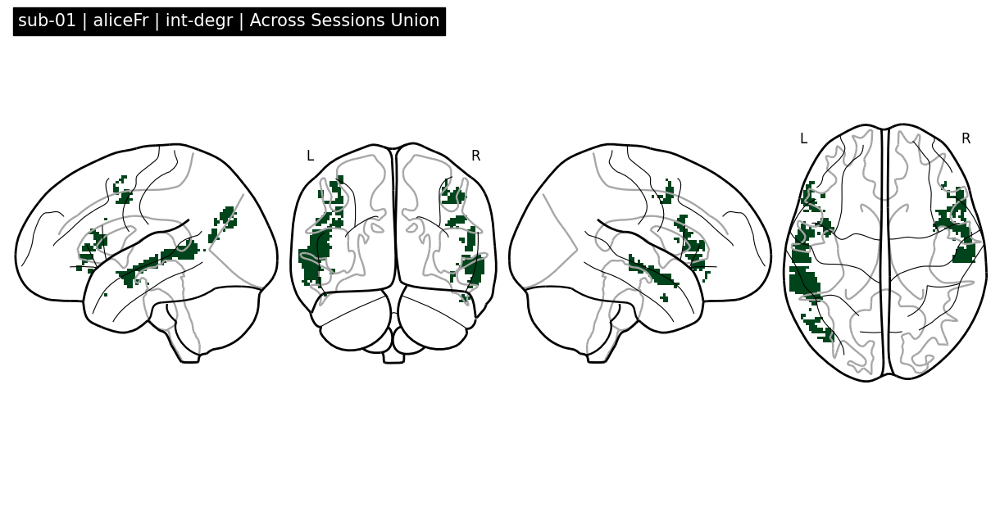

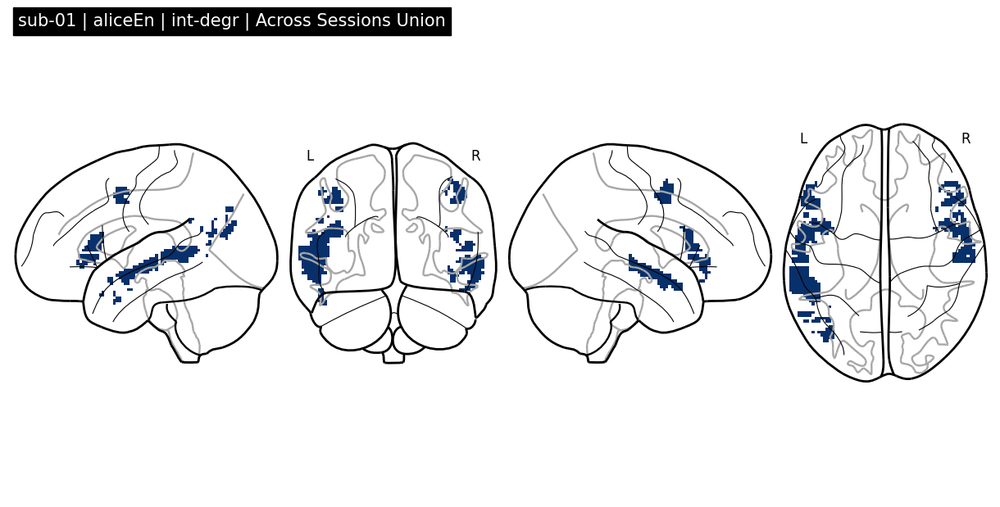

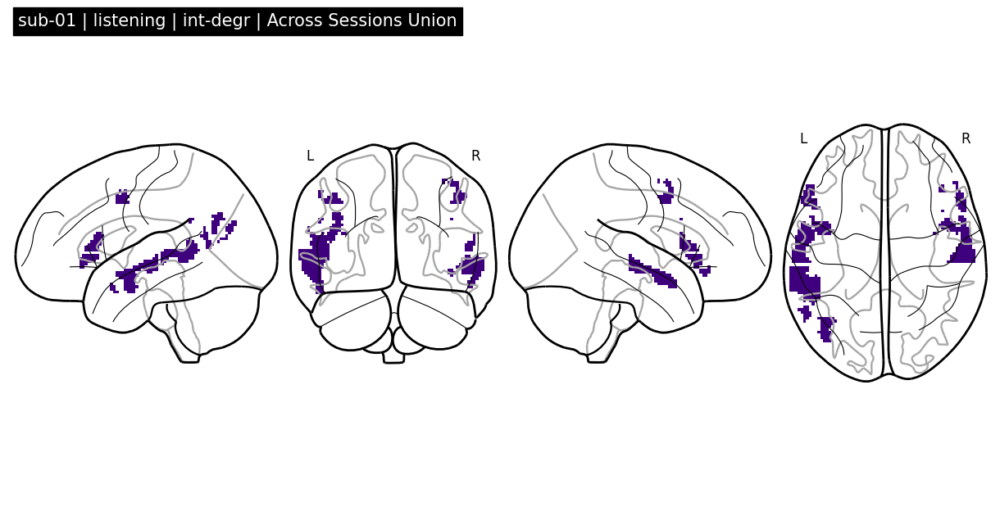

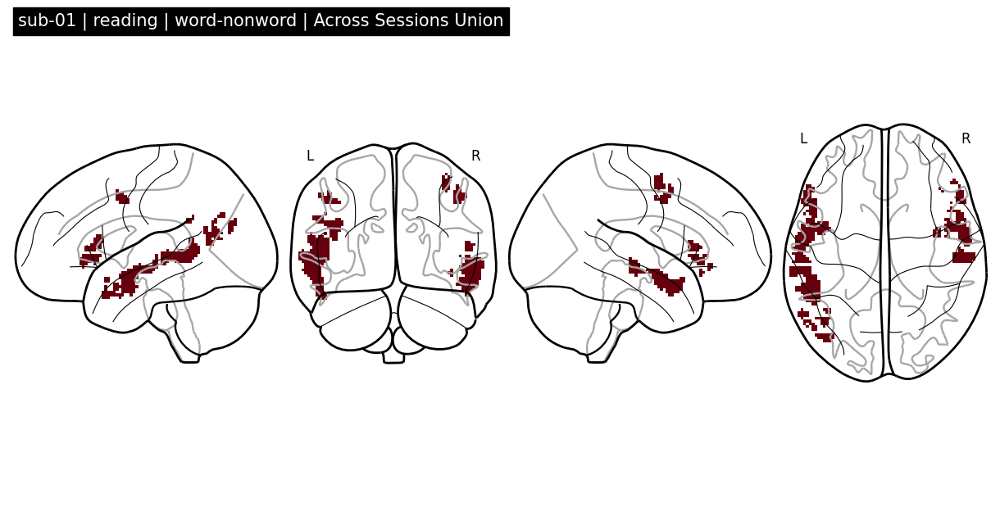

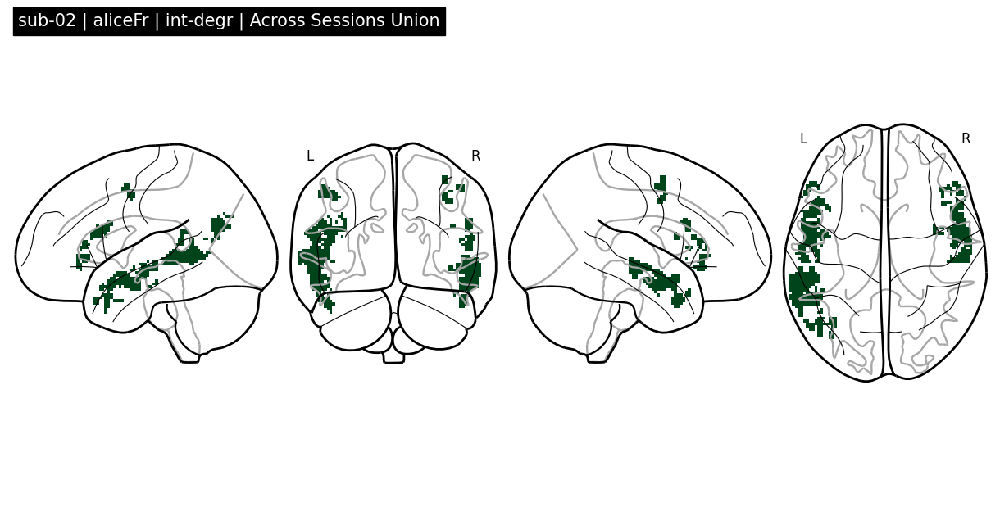

...

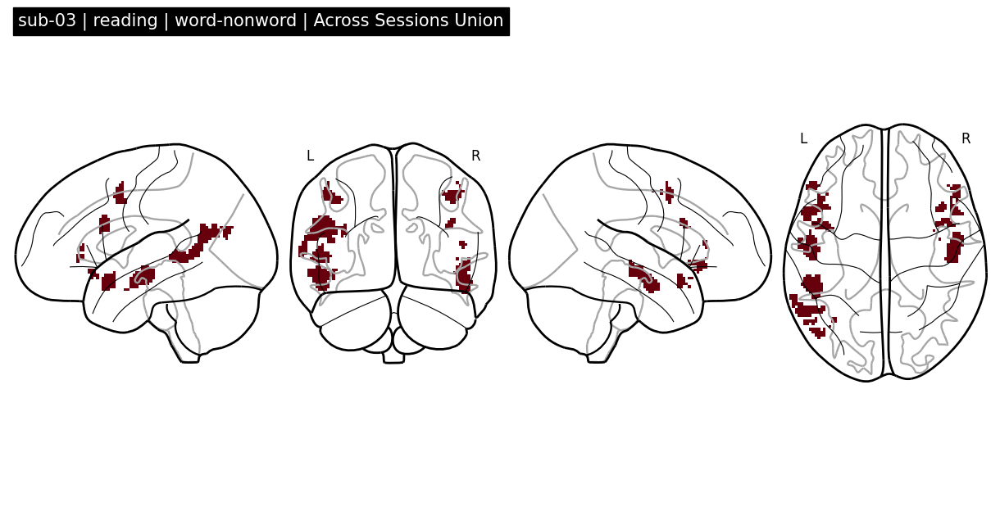

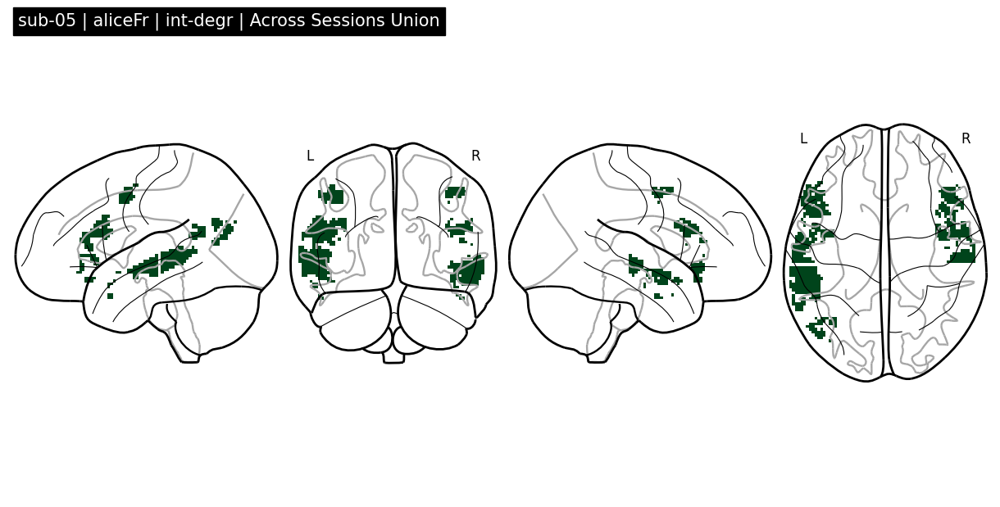

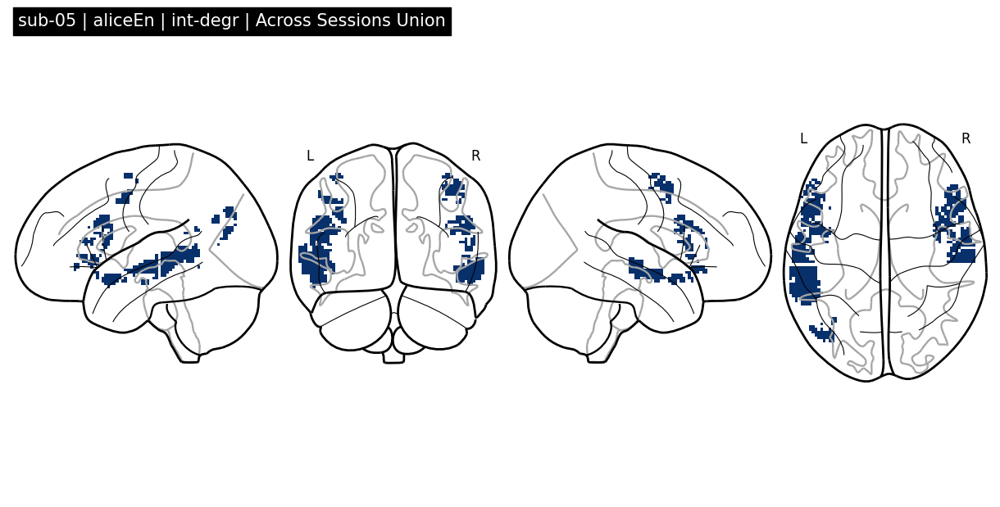

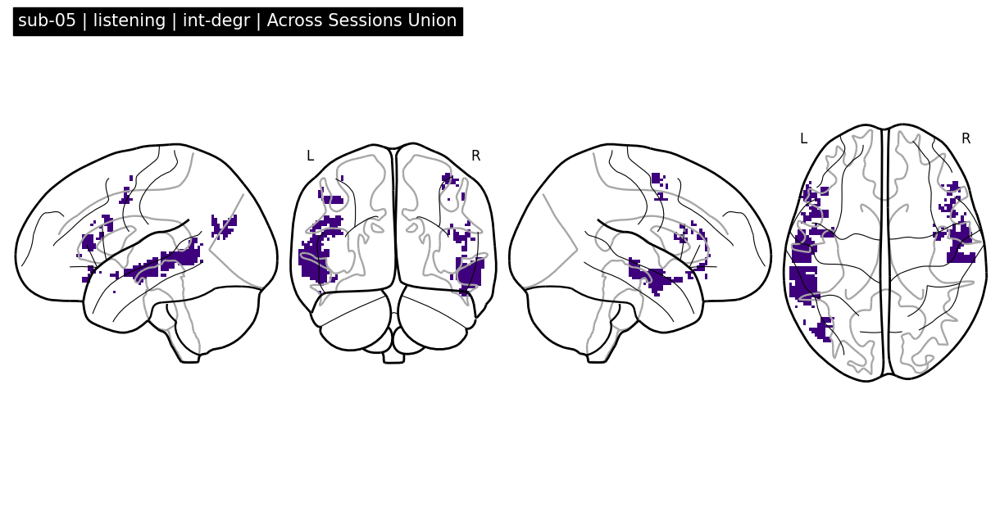

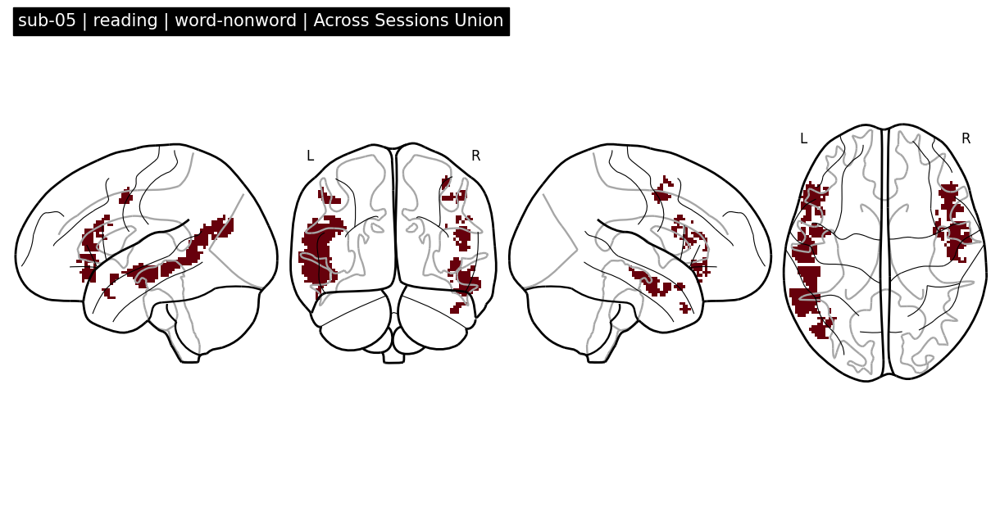

In [7]:
# Create across-session masks (union across sessions)

print("\n" + "="*80)
print("PART 2: CREATING ACROSS-SESSION fROI MASKS")
print("="*80)

for subject in SUBJECTS:
    print(f"\n{subject}:")
    print("-"*60)
    
    for task, contrast_list in TASK_CONTRASTS.items():
        cmap = TASK_COLORMAPS[task]
        
        for contrast in contrast_list:
            # Find all session-specific allLANG masks for this task
            pattern = f"{subject}_ses-*_task-{task}_contrast-{contrast}_allLANG_top{TOP_VOXELS}_union.nii.gz"
            session_masks = sorted(allLANG_MASK_DIR.glob(pattern))
            
            if len(session_masks) == 0:
                print(f"  {task:12s}: No session masks found")
                continue
            
            if len(session_masks) < 3:
                print(f"  {task:12s}: Only {len(session_masks)} sessions (expected 3)")
                # Still create across-session mask with available sessions
            
            print(f"  {task:12s}: Unioning {len(session_masks)} sessions")
            
            # Create union across sessions
           
            # Save NIfTI
            out_nii = allLANG_MASK_DIR / (
                f"{subject}_task-{task}_contrast-{contrast}_"
                f"allLANG_top{TOP_VOXELS}_across_sessions_union.nii.gz"
            )
            union_img = nib.load(str(out_nii))
            # print(f"                → Saved: {out_nii.name}")
            
            # Create visualization
            fig = plt.figure(figsize=(12, 6))
            display = plotting.plot_glass_brain(
                union_img,
                cmap=cmap,
                bg_img=None,
                black_bg=False,
                plot_abs=False,
                colorbar=False,
                display_mode="lyrz",
                threshold=0.1,
                alpha=1.0,
                vmax=1,
                title=f"{subject} | {task} | {contrast} | Across Sessions Union",
                figure=fig
            )
            
            fig.patch.set_facecolor("white")
            for ax_obj in fig.get_axes():
                ax_obj.set_facecolor("none")
                ax_obj.patch.set_alpha(0.0)
            
            # Save figure
            fig_name = f"{subject}_task-{task}_contrast-{contrast}_allLANG_across_sessions_{TOP_VOXELS}.png"
            fig_path = allLANG_FIG_DIR / fig_name
            fig.savefig(fig_path, dpi=300, bbox_inches="tight", pad_inches=0.1)
            print(f"                → Saved: {fig_path.name}")
            
            # plt.close(fig)

print("\n" + "="*80)
print("PART 2 COMPLETE: ACROSS-SESSION fROI MASKS")
print("="*80)
print(f"Session-specific masks: {allLANG_MASK_DIR}")
print(f"Across-session masks: {allLANG_MASK_DIR}")
print(f"Session figures: {allLANG_FIG_DIR}")
print(f"Across-session figures: {allLANG_FIG_DIR}")


CREATING 4-PANEL SUBJECT SPECIFICITY FIGURES

------------------------------------------------------------
1. MEAN OF ALL fROIs (allLANG)
------------------------------------------------------------
  ✓ Saved PNG: Figure_SubjectSpecificity_allLANG.png
  ✓ Saved PDF: Figure_SubjectSpecificity_allLANG.pdf


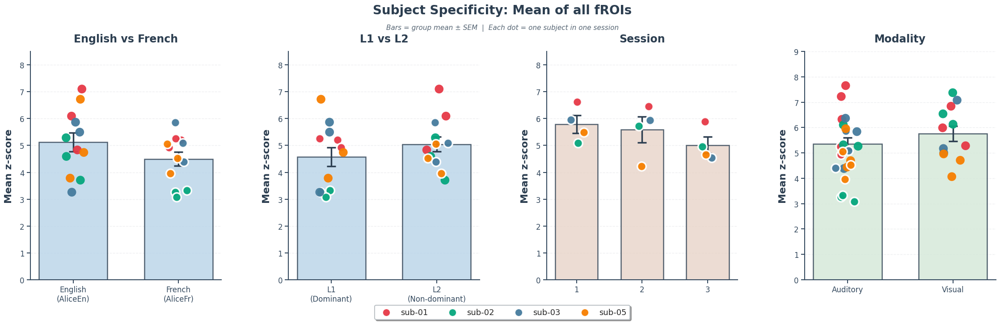


------------------------------------------------------------
2. LEFT HEMISPHERE
------------------------------------------------------------
  ✓ Saved PNG: Figure_SubjectSpecificity_LH.png
  ✓ Saved PDF: Figure_SubjectSpecificity_LH.pdf


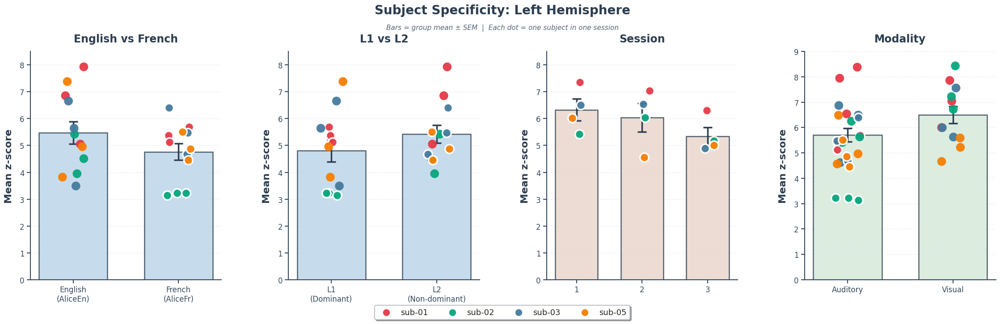


------------------------------------------------------------
3. RIGHT HEMISPHERE
------------------------------------------------------------
  ✓ Saved PNG: Figure_SubjectSpecificity_RH.png
  ✓ Saved PDF: Figure_SubjectSpecificity_RH.pdf


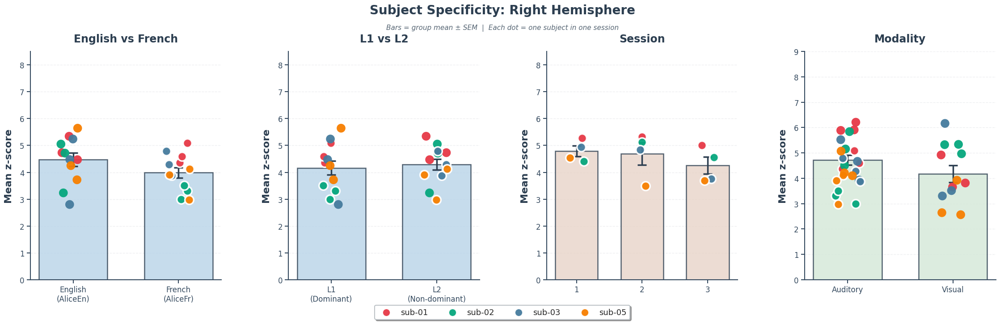


------------------------------------------------------------
4. INDIVIDUAL PARCELS
------------------------------------------------------------
Found 10 unique parcels
  Processing: LH_AntTemp
  ✓ Saved PNG: Figure_SubjectSpecificity_LH_AntTemp.png
  ✓ Saved PDF: Figure_SubjectSpecificity_LH_AntTemp.pdf


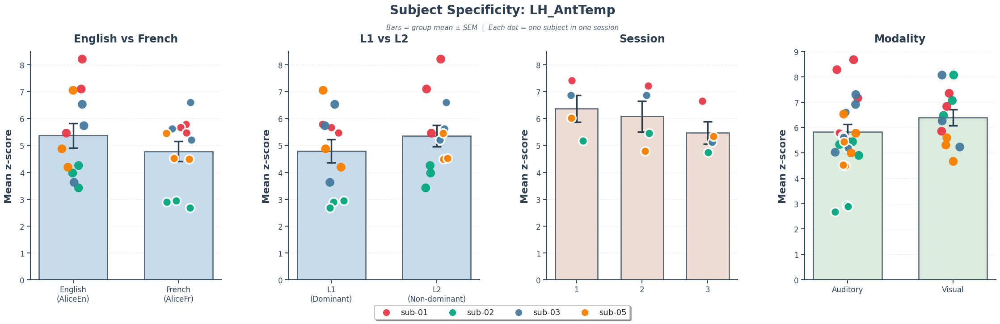

  Processing: LH_IFG
  ✓ Saved PNG: Figure_SubjectSpecificity_LH_IFG.png
  ✓ Saved PDF: Figure_SubjectSpecificity_LH_IFG.pdf


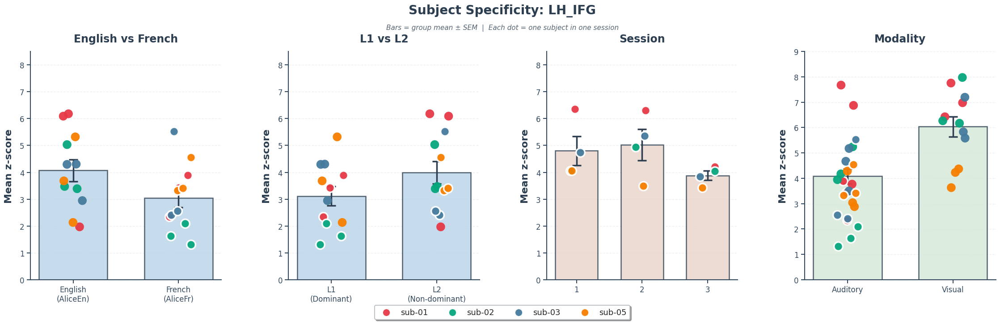

  Processing: LH_IFGorb
  ✓ Saved PNG: Figure_SubjectSpecificity_LH_IFGorb.png
  ✓ Saved PDF: Figure_SubjectSpecificity_LH_IFGorb.pdf


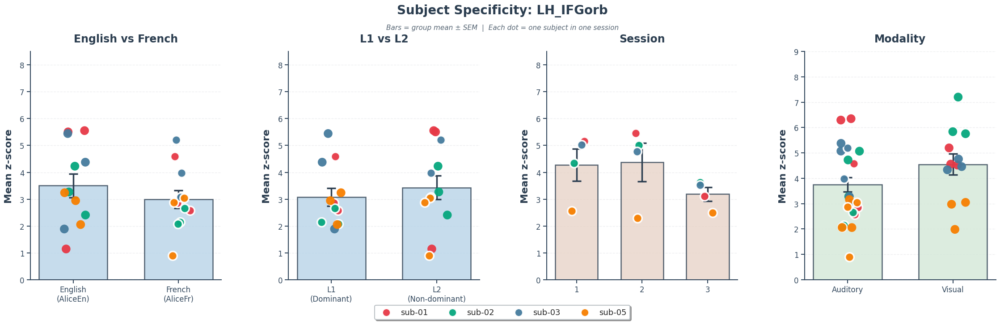

  Processing: LH_MFG
  ✓ Saved PNG: Figure_SubjectSpecificity_LH_MFG.png
  ✓ Saved PDF: Figure_SubjectSpecificity_LH_MFG.pdf


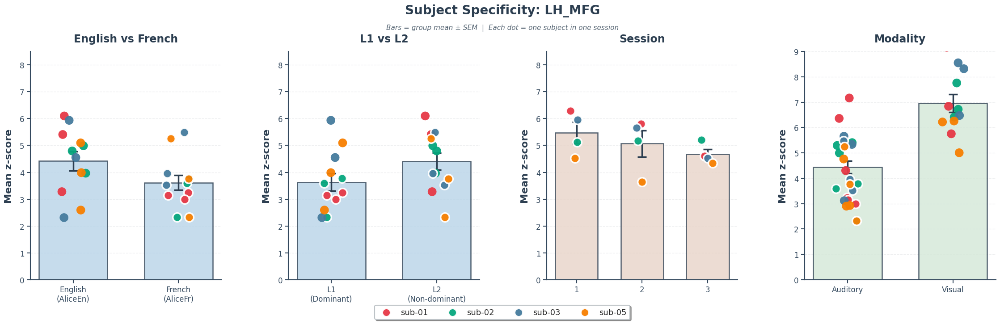

  Processing: LH_PostTemp
  ✓ Saved PNG: Figure_SubjectSpecificity_LH_PostTemp.png
  ✓ Saved PDF: Figure_SubjectSpecificity_LH_PostTemp.pdf


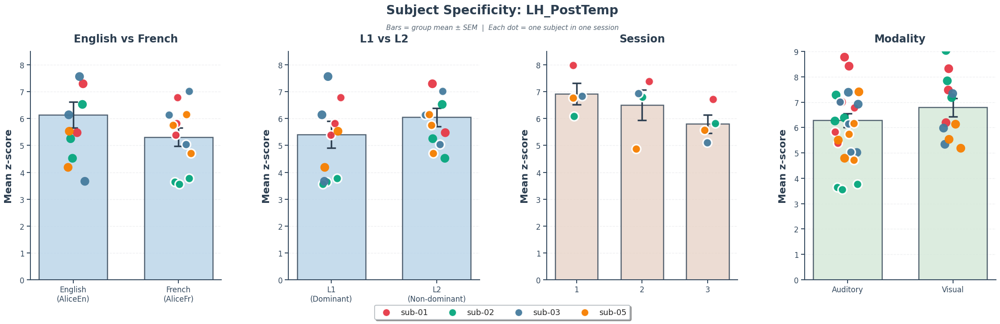

  Processing: RH_AntTemp
  ✓ Saved PNG: Figure_SubjectSpecificity_RH_AntTemp.png
  ✓ Saved PDF: Figure_SubjectSpecificity_RH_AntTemp.pdf


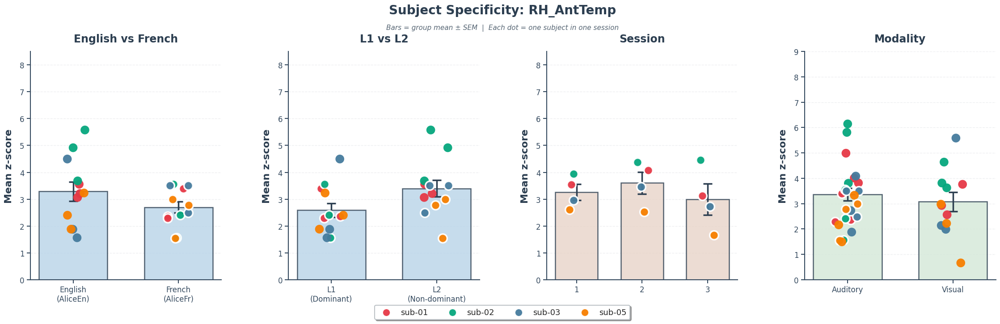

  Processing: RH_IFG
  ✓ Saved PNG: Figure_SubjectSpecificity_RH_IFG.png
  ✓ Saved PDF: Figure_SubjectSpecificity_RH_IFG.pdf


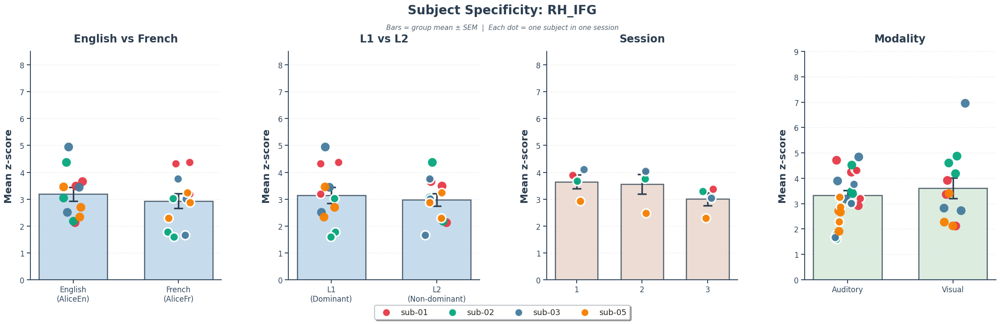

  Processing: RH_IFGorb
  ✓ Saved PNG: Figure_SubjectSpecificity_RH_IFGorb.png
  ✓ Saved PDF: Figure_SubjectSpecificity_RH_IFGorb.pdf


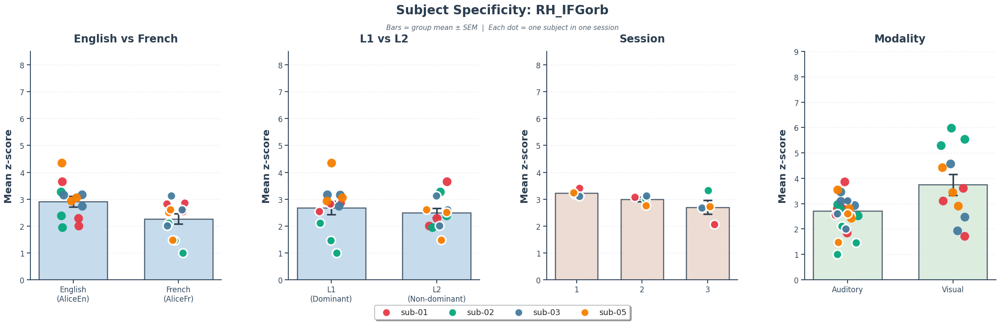

  Processing: RH_MFG
  ✓ Saved PNG: Figure_SubjectSpecificity_RH_MFG.png
  ✓ Saved PDF: Figure_SubjectSpecificity_RH_MFG.pdf


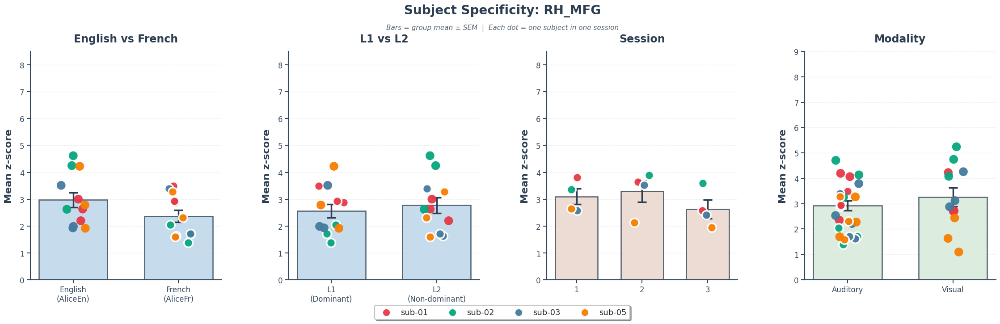

  Processing: RH_PostTemp
  ✓ Saved PNG: Figure_SubjectSpecificity_RH_PostTemp.png
  ✓ Saved PDF: Figure_SubjectSpecificity_RH_PostTemp.pdf


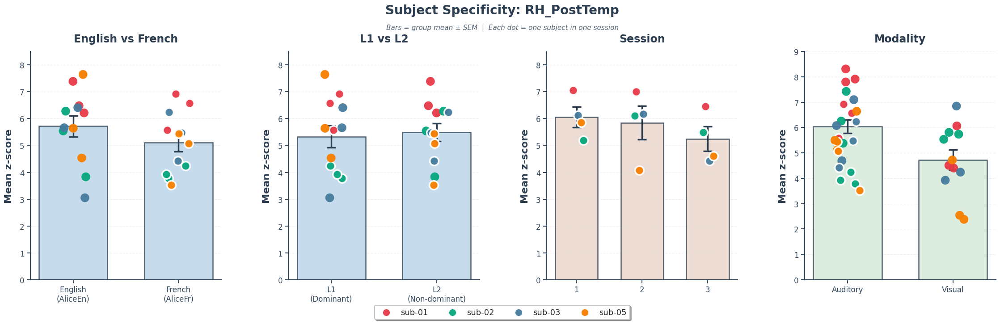


✓ ALL 4-PANEL FIGURES COMPLETE


In [19]:
# ============================================================================
# CELL 5: Subject Specificity - 4-PANEL FIGURE (Language + Session + Modality)
# ============================================================================
"""
4-panel figure with:
1. English vs French (AliceEn vs AliceFr)
2. L1 vs L2 (dominance-based)
3. Session stability
4. Modality (auditory vs visual)
"""
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.gridspec import GridSpec
from pathlib import Path
import nibabel as nib
from nilearn.image import resample_to_img

# ============================================================================
# SUBJECT LANGUAGE DOMINANCE MAPPING
# ============================================================================

SUBJECT_LANGUAGE_DOMINANCE = {
    "sub-01": {"L1": "French", "L2": "English"},
    "sub-02": {"L1": "French", "L2": "English"},
    "sub-03": {"L1": "English", "L2": "French"},
    "sub-05": {"L1": "English", "L2": "French"},
}

# Bar colors
BAR_COLOR_PALETTE = {
    "language": "#B8D4E8",
    "session": "#E8D4C8",
    "modality": "#D4E8D8",
}

SUBJECT_COLORS = {
    "sub-01": "#E63946",
    "sub-02": "#06A77D",
    "sub-03": "#457B9D",
    "sub-05": "#F77F00",
    "sub-06": "#9D4EDD",
}


def create_subject_specificity_figure_4panel(df_all, roi_type="allLANG", save=True):
    """Create 4-panel subject specificity figure with both language panels."""
    
    if df_all is None or len(df_all) == 0:
        print(f"No data for {roi_type}")
        return None
    
    plt.style.use('seaborn-v0_8-white')
    fig = plt.figure(figsize=(24, 7))
    gs = GridSpec(1, 4, wspace=0.35, left=0.06, right=0.96, top=0.85, bottom=0.12)
    
    # =========================================================================
    # PANEL 1: LANGUAGE - English vs French
    # =========================================================================
    ax1 = fig.add_subplot(gs[0])
    
    # Filter for Alice tasks only
    df_alice = df_all[df_all["task"].isin(["aliceEn", "aliceFr"])].copy()
    
    if len(df_alice) > 0:
        # Session-level data for dots
        lang_session = df_alice.groupby(["subject", "language", "session"])["value"].mean().reset_index()
        
        # Bar statistics
        lang_summary_bar = df_alice.groupby(["language"])["value"].agg(['mean', 'sem']).reset_index()
        
        languages = ["English", "French"]
        x_pos = np.arange(len(languages))
        bar_width = 0.65
        
        # Draw bars
        bars = ax1.bar(x_pos, lang_summary_bar["mean"].values, bar_width, 
                       color=BAR_COLOR_PALETTE["language"], alpha=0.8, 
                       edgecolor='#2C3E50', linewidth=1.8, zorder=2)
        
        # Error bars
        ax1.errorbar(x_pos, lang_summary_bar["mean"].values, 
                    yerr=lang_summary_bar["sem"].values, 
                    fmt='none', color='#2C3E50', capsize=7, 
                    linewidth=2.5, capthick=2.5, zorder=3)
        
        # Individual session dots
        for lang_idx, lang in enumerate(languages):
            lang_data = lang_session[lang_session["language"] == lang]
            for _, row in lang_data.iterrows():
                jitter = np.random.uniform(-0.12, 0.12)
                
                # French = white edge, English = no edge
                if lang == "French":
                    ax1.scatter(x_pos[lang_idx] + jitter, row["value"], 
                               color=SUBJECT_COLORS.get(row["subject"], '#7F8C8D'), 
                               s=200, zorder=10, marker='o', 
                               edgecolor='white', linewidth=2.5, alpha=0.95)
                else:
                    ax1.scatter(x_pos[lang_idx] + jitter, row["value"], 
                               color=SUBJECT_COLORS.get(row["subject"], '#7F8C8D'), 
                               s=200, zorder=10, marker='o', 
                               edgecolor='none', alpha=0.95)
        
        # Styling
        ax1.set_ylabel("Mean z-score", fontsize=16, fontweight='600', 
                      color='#2C3E50', labelpad=10)
        ax1.set_xticks(x_pos)
        ax1.set_xticklabels(["English\n(AliceEn)", "French\n(AliceFr)"], 
                           fontsize=14, color='#34495E')
        ax1.set_title("English vs French", fontsize=17, fontweight='700', 
                     color='#2C3E50', pad=15)
        ax1.set_ylim([0, 8.5])
        ax1.set_yticks(np.arange(0, 9, 1))
        ax1.grid(axis='y', alpha=0.25, linestyle='--', linewidth=1, color='#BDC3C7')
        ax1.spines['top'].set_visible(False)
        ax1.spines['right'].set_visible(False)
        ax1.spines['left'].set_linewidth(1.5)
        ax1.spines['left'].set_color('#34495E')
        ax1.spines['bottom'].set_linewidth(1.5)
        ax1.spines['bottom'].set_color('#34495E')
        ax1.axhline(0, color='#7F8C8D', linewidth=1.5, linestyle='--', 
                   alpha=0.6, zorder=1)
        ax1.tick_params(axis='both', which='major', labelsize=12, 
                       colors='#34495E', width=1.5, length=6)
    
    # =========================================================================
    # PANEL 2: LANGUAGE DOMINANCE - L1 vs L2
    # =========================================================================
    ax2 = fig.add_subplot(gs[1])
    
    if len(df_alice) > 0:
        df_alice_dom = df_alice.copy()
        
        # Map language to dominance
        def get_dominance_language(row):
            subject = row["subject"]
            language = row["language"]
            if subject not in SUBJECT_LANGUAGE_DOMINANCE:
                return None
            if language == SUBJECT_LANGUAGE_DOMINANCE[subject]["L1"]:
                return "L1"
            elif language == SUBJECT_LANGUAGE_DOMINANCE[subject]["L2"]:
                return "L2"
            return None
        
        df_alice_dom["dominance"] = df_alice_dom.apply(get_dominance_language, axis=1)
        df_alice_dom = df_alice_dom.dropna(subset=["dominance"])
        
        # Session-level data
        dom_session = df_alice_dom.groupby(["subject", "dominance", "session", "language"])["value"].mean().reset_index()
        
        # Bar statistics
        dom_summary_bar = df_alice_dom.groupby(["dominance"])["value"].agg(['mean', 'sem']).reset_index()
        dom_summary_bar = dom_summary_bar.set_index("dominance").reindex(["L1", "L2"]).reset_index()
        
        dominances = ["L1", "L2"]
        x_pos_d = np.arange(len(dominances))
        
        # Draw bars
        bars2 = ax2.bar(x_pos_d, dom_summary_bar["mean"].values, bar_width, 
                        color=BAR_COLOR_PALETTE["language"], alpha=0.8, 
                        edgecolor='#2C3E50', linewidth=1.8, zorder=2)
        
        # Error bars
        ax2.errorbar(x_pos_d, dom_summary_bar["mean"].values, 
                    yerr=dom_summary_bar["sem"].values, 
                    fmt='none', color='#2C3E50', capsize=7, 
                    linewidth=2.5, capthick=2.5, zorder=3)
        
        # Individual session dots
        for dom_idx, dom in enumerate(dominances):
            dom_data = dom_session[dom_session["dominance"] == dom]
            for _, row in dom_data.iterrows():
                jitter = np.random.uniform(-0.12, 0.12)
                
                # French = white edge, English = no edge
                if row["language"] == "French":
                    ax2.scatter(x_pos_d[dom_idx] + jitter, row["value"], 
                               color=SUBJECT_COLORS.get(row["subject"], '#7F8C8D'), 
                               s=200, zorder=10, marker='o', 
                               edgecolor='white', linewidth=2.5, alpha=0.95)
                else:
                    ax2.scatter(x_pos_d[dom_idx] + jitter, row["value"], 
                               color=SUBJECT_COLORS.get(row["subject"], '#7F8C8D'), 
                               s=200, zorder=10, marker='o', 
                               edgecolor='none', alpha=0.95)
        
        # Styling
        ax2.set_ylabel("Mean z-score", fontsize=16, fontweight='600', 
                      color='#2C3E50', labelpad=10)
        ax2.set_xticks(x_pos_d)
        ax2.set_xticklabels(["L1\n(Dominant)", "L2\n(Non-dominant)"], 
                           fontsize=14, color='#34495E')
        ax2.set_title("L1 vs L2", fontsize=17, fontweight='700', 
                     color='#2C3E50', pad=15)
        ax2.set_ylim([0, 8.5])
        ax2.set_yticks(np.arange(0, 9, 1))
        ax2.grid(axis='y', alpha=0.25, linestyle='--', linewidth=1, color='#BDC3C7')
        ax2.spines['top'].set_visible(False)
        ax2.spines['right'].set_visible(False)
        ax2.spines['left'].set_linewidth(1.5)
        ax2.spines['left'].set_color('#34495E')
        ax2.spines['bottom'].set_linewidth(1.5)
        ax2.spines['bottom'].set_color('#34495E')
        ax2.axhline(0, color='#7F8C8D', linewidth=1.5, linestyle='--', 
                   alpha=0.6, zorder=1)
        ax2.tick_params(axis='both', which='major', labelsize=12, 
                       colors='#34495E', width=1.5, length=6)
    
    # =========================================================================
    # PANEL 3: SESSION EFFECT
    # =========================================================================
    ax3 = fig.add_subplot(gs[2])
    
    sess_summary = df_all.groupby(["subject", "session"])["value"].mean().reset_index()
    sessions = sorted(df_all["session"].unique())
    x_pos_s = np.arange(len(sessions))
    
    group_means_s = []
    group_sems_s = []
    for sess in sessions:
        sess_vals = sess_summary[sess_summary["session"] == sess]["value"]
        group_means_s.append(sess_vals.mean() if len(sess_vals) > 0 else 0)
        group_sems_s.append(sess_vals.sem() if len(sess_vals) > 0 else 0)
    
    bars3 = ax3.bar(x_pos_s, group_means_s, bar_width, 
                    color=BAR_COLOR_PALETTE["session"], alpha=0.8, 
                    edgecolor='#2C3E50', linewidth=1.8, zorder=2)
    
    ax3.errorbar(x_pos_s, group_means_s, yerr=group_sems_s, 
                fmt='none', color='#2C3E50', capsize=7, 
                linewidth=2.5, capthick=2.5, zorder=3)
    
    for sess_idx, sess in enumerate(sessions):
        sess_data = sess_summary[sess_summary["session"] == sess]
        for _, row in sess_data.iterrows():
            jitter = np.random.uniform(-0.12, 0.12)
            ax3.scatter(x_pos_s[sess_idx] + jitter, row["value"], 
                       color=SUBJECT_COLORS.get(row["subject"], '#7F8C8D'), 
                       s=200, zorder=10, edgecolor='white', 
                       linewidth=2.5, alpha=0.95)
    
    ax3.set_ylabel("Mean z-score", fontsize=16, fontweight='600', 
                  color='#2C3E50', labelpad=10)
    ax3.set_xticks(x_pos_s)
    ax3.set_xticklabels([s.replace("ses-00", "") for s in sessions], 
                       fontsize=14, color='#34495E')
    ax3.set_title("Session", fontsize=17, fontweight='700', 
                 color='#2C3E50', pad=15)
    ax3.set_ylim([0, 8.5])
    ax3.set_yticks(np.arange(0, 9, 1))
    ax3.grid(axis='y', alpha=0.25, linestyle='--', linewidth=1, color='#BDC3C7')
    ax3.spines['top'].set_visible(False)
    ax3.spines['right'].set_visible(False)
    ax3.spines['left'].set_linewidth(1.5)
    ax3.spines['left'].set_color('#34495E')
    ax3.spines['bottom'].set_linewidth(1.5)
    ax3.spines['bottom'].set_color('#34495E')
    ax3.axhline(0, color='#7F8C8D', linewidth=1.5, linestyle='--', 
               alpha=0.6, zorder=1)
    ax3.tick_params(axis='both', which='major', labelsize=12, 
                   colors='#34495E', width=1.5, length=6)
    
    # =========================================================================
    # PANEL 4: MODALITY EFFECT (SESSION-LEVEL DOTS)
    # =========================================================================
    ax4 = fig.add_subplot(gs[3])
    
    # Session-level data for modality
    mod_session = df_all.groupby(["subject", "modality", "session", "language"])["value"].mean().reset_index()
    
    # Bar statistics
    modalities = ["auditory", "visual"]
    x_pos_m = np.arange(len(modalities))
    
    group_means_m = []
    group_sems_m = []
    for mod in modalities:
        mod_vals = df_all[df_all["modality"] == mod]["value"]
        group_means_m.append(mod_vals.mean() if len(mod_vals) > 0 else 0)
        group_sems_m.append(mod_vals.sem() if len(mod_vals) > 0 else 0)
    
    # Draw bars
    bars4 = ax4.bar(x_pos_m, group_means_m, bar_width, 
                    color=BAR_COLOR_PALETTE["modality"], alpha=0.8, 
                    edgecolor='#2C3E50', linewidth=1.8, zorder=2)
    
    # Error bars
    ax4.errorbar(x_pos_m, group_means_m, yerr=group_sems_m, 
                fmt='none', color='#2C3E50', capsize=7, 
                linewidth=2.5, capthick=2.5, zorder=3)
    
    # Individual session dots
    for mod_idx, mod in enumerate(modalities):
        mod_data = mod_session[mod_session["modality"] == mod]
        for _, row in mod_data.iterrows():
            jitter = np.random.uniform(-0.12, 0.12)
            
            # French = white edge, English = no edge
            if row["language"] == "French":
                ax4.scatter(x_pos_m[mod_idx] + jitter, row["value"], 
                           color=SUBJECT_COLORS.get(row["subject"], '#7F8C8D'), 
                           s=200, zorder=10, marker='o', 
                           edgecolor='white', linewidth=2.5, alpha=0.95)
            else:
                ax4.scatter(x_pos_m[mod_idx] + jitter, row["value"], 
                           color=SUBJECT_COLORS.get(row["subject"], '#7F8C8D'), 
                           s=200, zorder=10, marker='o', 
                           edgecolor='none', alpha=0.95)
    
    # Styling
    ax4.set_ylabel("Mean z-score", fontsize=16, fontweight='600', 
                  color='#2C3E50', labelpad=10)
    ax4.set_xticks(x_pos_m)
    ax4.set_xticklabels(["Auditory", "Visual"], fontsize=14, color='#34495E')
    ax4.set_title("Modality", fontsize=17, fontweight='700', 
                 color='#2C3E50', pad=15)
    ax4.set_ylim([0, 9])
    ax4.set_yticks(np.arange(0, 8.7, 1))
    ax4.grid(axis='y', alpha=0.25, linestyle='--', linewidth=1, color='#BDC3C7')
    ax4.spines['top'].set_visible(False)
    ax4.spines['right'].set_visible(False)
    ax4.spines['left'].set_linewidth(1.5)
    ax4.spines['left'].set_color('#34495E')
    ax4.spines['bottom'].set_linewidth(1.5)
    ax4.spines['bottom'].set_color('#34495E')
    ax4.axhline(0, color='#7F8C8D', linewidth=1.5, linestyle='--', 
               alpha=0.6, zorder=1)
    ax4.tick_params(axis='both', which='major', labelsize=12, 
                   colors='#34495E', width=1.5, length=6)
    
    # =========================================================================
    # TITLE AND LEGEND
    # =========================================================================
    roi_label = "Mean of all fROIs" if roi_type == "allLANG" else \
                "Left Hemisphere" if roi_type == "LH" else \
                "Right Hemisphere" if roi_type == "RH" else roi_type
    
    fig.text(0.5, 0.97, f"Subject Specificity: {roi_label}", 
             ha='center', fontsize=20, fontweight='700', color='#2C3E50', 
             transform=fig.transFigure)
    fig.text(0.5, 0.92, "Bars = group mean ± SEM  |  Each dot = one subject in one session", 
             ha='center', fontsize=11, style='italic', color='#566573', 
             transform=fig.transFigure)
    
    # Subject legend
    subjects_present = sorted(df_all["subject"].unique())
    handles = [plt.scatter([], [], s=180, color=SUBJECT_COLORS[s], 
                          edgecolor='white', linewidth=2.5, alpha=0.95) 
              for s in subjects_present]
    
    legend = fig.legend(handles, subjects_present, loc='lower center', 
                       ncol=len(subjects_present), frameon=True, fontsize=13, 
                       bbox_to_anchor=(0.5, -0.02), fancybox=True, shadow=True, 
                       facecolor='white', edgecolor='#BDC3C7', title_fontsize=14)
    legend.get_frame().set_linewidth(1.5)
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.90])
    
    if save:
        safe_roi = roi_type.replace(" ", "_").replace("/", "-")
        output_file = FIG_DIR / f"Figure_SubjectSpecificity_{safe_roi}.png"
        plt.savefig(output_file, dpi=300, bbox_inches='tight', facecolor='white')
        output_pdf = FIG_DIR / f"Figure_SubjectSpecificity_{safe_roi}.pdf"
        plt.savefig(output_pdf, bbox_inches='tight', facecolor='white')
        print(f"  ✓ Saved PNG: {output_file.name}")
        print(f"  ✓ Saved PDF: {output_pdf.name}")
    
    plt.show()
    return fig


def extract_all_subjects_froi_data(roi_type="allLANG"):
    """Extract data for ALL subjects using their own fROIs."""
    all_data = []
    for subject in SUBJECTS:
        session_data = extract_subject_froi_data(subject, roi_type)
        if not session_data:
            continue
        df_subj = pd.DataFrame(session_data)
        all_data.append(df_subj)
    if not all_data:
        return None
    df_all = pd.concat(all_data, ignore_index=True)
    return df_all


def get_subject_parcels(subject):
    """Get list of parcels that exist for this subject."""
    FED_LABELS_TXT = Path("/scratch/ibilgin/fedorenko_atlas/allParcels-language-SN220.txt")
    if not FED_LABELS_TXT.exists():
        print(f"Warning: {FED_LABELS_TXT} not found")
        return []
    with open(FED_LABELS_TXT) as f:
        all_parcels = [l.strip() for l in f if l.strip()]
    available_parcels = []
    for parcel in all_parcels:
        pattern = f"{subject}_ses-*_task-*_contrast-*_parcel-{parcel}_top{TOP_VOXELS}.nii.gz"
        if list(OUT_DIR.glob(pattern)):
            available_parcels.append(parcel)
    return available_parcels


# ============================================================================
# GENERATE FIGURES
# ============================================================================

print("\n" + "="*80)
print("CREATING 4-PANEL SUBJECT SPECIFICITY FIGURES")
print("="*80)

# 1. allLANG
print("\n" + "-"*60)
print("1. MEAN OF ALL fROIs (allLANG)")
print("-"*60)
df_allLANG = extract_all_subjects_froi_data(roi_type="allLANG")
if df_allLANG is not None:
    create_subject_specificity_figure_4panel(df_allLANG, roi_type="allLANG", save=True)

# 2. Left Hemisphere
print("\n" + "-"*60)
print("2. LEFT HEMISPHERE")
print("-"*60)
df_LH = extract_all_subjects_froi_data(roi_type="LH")
if df_LH is not None:
    create_subject_specificity_figure_4panel(df_LH, roi_type="LH", save=True)

# 3. Right Hemisphere
print("\n" + "-"*60)
print("3. RIGHT HEMISPHERE")
print("-"*60)
df_RH = extract_all_subjects_froi_data(roi_type="RH")
if df_RH is not None:
    create_subject_specificity_figure_4panel(df_RH, roi_type="RH", save=True)

# 4. Individual parcels
print("\n" + "-"*60)
print("4. INDIVIDUAL PARCELS")
print("-"*60)

all_parcels = set()
for subject in SUBJECTS:
    parcels = get_subject_parcels(subject)
    all_parcels.update(parcels)

print(f"Found {len(all_parcels)} unique parcels")

for parcel in sorted(all_parcels):
    print(f"  Processing: {parcel}")
    df_parcel = extract_all_subjects_froi_data(roi_type=parcel)
    if df_parcel is not None:
        create_subject_specificity_figure_4panel(df_parcel, roi_type=parcel, save=True)

print("\n" + "="*80)
print("✓ ALL 4-PANEL FIGURES COMPLETE")
print("="*80)

# LangLocalizer Statistical Comparisons

In [17]:
import pandas as pd
import numpy as np
from scipy import stats
from pathlib import Path

# Load the data from Figure 2
# Assuming you have the dataframe from the subject specificity analysis
# If you need to recreate it, use the extract_all_subjects_froi_data() function

# For now, let's assume df_lh exists from your earlier analysis
# If not, run this:
df_lh = extract_all_subjects_froi_data(roi_type="LH")

print("Data loaded:")
print(f"Total observations: {len(df_lh)}")
print(f"Subjects: {sorted(df_lh['subject'].unique())}")
print(f"Tasks: {sorted(df_lh['task'].unique())}")
print(f"\nData preview:")
print(df_lh.head())

Data loaded:
Total observations: 48
Subjects: ['sub-01', 'sub-02', 'sub-03', 'sub-05']
Tasks: ['aliceEn', 'aliceFr', 'listening', 'reading']

Data preview:
  subject  session       task  contrast  modality language    domain  \
0  sub-01  ses-001  listening  int-degr  auditory  English  language   
1  sub-01  ses-002  listening  int-degr  auditory  English  language   
2  sub-01  ses-003  listening  int-degr  auditory  English  language   
3  sub-01  ses-001    aliceFr  int-degr  auditory   French  language   
4  sub-01  ses-002    aliceFr  int-degr  auditory   French  language   

      value roi_type  
0  9.036694       LH  
1  8.832531       LH  
2  8.023854       LH  
3  5.684536       LH  
4  5.375952       LH  


In [18]:
print("="*80)
print("PANEL A: ENGLISH vs FRENCH")
print("="*80)

# Filter for Alice tasks (auditory narratives only)
df_alice = df_lh[df_lh["task"].isin(["aliceEn", "aliceFr"])].copy()

# Summary statistics by language
lang_summary = df_alice.groupby("language")["value"].agg(['count', 'mean', 'std', 'sem'])
print("\nSummary by Language:")
print(lang_summary)

# Get values for statistical test
english_vals = df_alice[df_alice["language"] == "English"]["value"].values
french_vals = df_alice[df_alice["language"] == "French"]["value"].values

print(f"\nEnglish (aliceEn): n={len(english_vals)}, mean={np.mean(english_vals):.2f} ± {stats.sem(english_vals):.2f}")
print(f"French (aliceFr):  n={len(french_vals)}, mean={np.mean(french_vals):.2f} ± {stats.sem(french_vals):.2f}")

# Paired t-test (if we have matched observations per subject)
# First, create subject-averaged values
eng_by_subj = df_alice[df_alice["language"] == "English"].groupby("subject")["value"].mean()
fr_by_subj = df_alice[df_alice["language"] == "French"].groupby("subject")["value"].mean()

# Get common subjects
common_subjects = sorted(set(eng_by_subj.index) & set(fr_by_subj.index))
eng_paired = [eng_by_subj[s] for s in common_subjects]
fr_paired = [fr_by_subj[s] for s in common_subjects]

t_stat, p_val = stats.ttest_rel(eng_paired, fr_paired)
print(f"\nPaired t-test (n={len(common_subjects)} subjects):")
print(f"  t({len(common_subjects)-1}) = {t_stat:.3f}, p = {p_val:.4f}")

# Effect size (Cohen's d for paired samples)
diff = np.array(eng_paired) - np.array(fr_paired)
cohens_d = np.mean(diff) / np.std(diff, ddof=1)
print(f"  Cohen's d = {cohens_d:.3f}")

PANEL A: ENGLISH vs FRENCH

Summary by Language:
          count      mean       std       sem
language                                     
English      12  5.469700  1.456206  0.420371
French       12  4.763681  1.067481  0.308155

English (aliceEn): n=12, mean=5.47 ± 0.42
French (aliceFr):  n=12, mean=4.76 ± 0.31

Paired t-test (n=4 subjects):
  t(3) = 1.837, p = 0.1635
  Cohen's d = 0.919


In [19]:
print("="*80)
print("PANEL B: L1 (DOMINANT) vs L2 (NON-DOMINANT)")
print("="*80)

# Define language dominance mapping
SUBJECT_LANGUAGE_DOMINANCE = {
    "sub-01": {"L1": "French", "L2": "English"},
    "sub-02": {"L1": "French", "L2": "English"},
    "sub-03": {"L1": "English", "L2": "French"},
    "sub-05": {"L1": "English", "L2": "French"},
}

# Add dominance column
def get_dominance(row):
    subject = row["subject"]
    language = row["language"]
    if subject not in SUBJECT_LANGUAGE_DOMINANCE:
        return None
    if language == SUBJECT_LANGUAGE_DOMINANCE[subject]["L1"]:
        return "L1"
    elif language == SUBJECT_LANGUAGE_DOMINANCE[subject]["L2"]:
        return "L2"
    return None

df_alice["dominance"] = df_alice.apply(get_dominance, axis=1)
df_dom = df_alice.dropna(subset=["dominance"])

# Summary statistics by dominance
dom_summary = df_dom.groupby("dominance")["value"].agg(['count', 'mean', 'std', 'sem'])
print("\nSummary by Language Dominance:")
print(dom_summary)

l1_vals = df_dom[df_dom["dominance"] == "L1"]["value"].values
l2_vals = df_dom[df_dom["dominance"] == "L2"]["value"].values

print(f"\nL1 (Dominant):     n={len(l1_vals)}, mean={np.mean(l1_vals):.2f} ± {stats.sem(l1_vals):.2f}")
print(f"L2 (Non-dominant): n={len(l2_vals)}, mean={np.mean(l2_vals):.2f} ± {stats.sem(l2_vals):.2f}")

# Paired t-test
l1_by_subj = df_dom[df_dom["dominance"] == "L1"].groupby("subject")["value"].mean()
l2_by_subj = df_dom[df_dom["dominance"] == "L2"].groupby("subject")["value"].mean()

common_subjects = sorted(set(l1_by_subj.index) & set(l2_by_subj.index))
l1_paired = [l1_by_subj[s] for s in common_subjects]
l2_paired = [l2_by_subj[s] for s in common_subjects]

t_stat, p_val = stats.ttest_rel(l1_paired, l2_paired)
print(f"\nPaired t-test (n={len(common_subjects)} subjects):")
print(f"  t({len(common_subjects)-1}) = {t_stat:.3f}, p = {p_val:.4f}")

diff = np.array(l1_paired) - np.array(l2_paired)
cohens_d = np.mean(diff) / np.std(diff, ddof=1)
print(f"  Cohen's d = {cohens_d:.3f}")

# Show by-subject breakdown
print("\nBy-subject language dominance:")
for subj in common_subjects:
    l1_lang = SUBJECT_LANGUAGE_DOMINANCE[subj]["L1"]
    l2_lang = SUBJECT_LANGUAGE_DOMINANCE[subj]["L2"]
    print(f"  {subj}: L1={l1_lang} (z={l1_by_subj[subj]:.2f}), L2={l2_lang} (z={l2_by_subj[subj]:.2f})")

PANEL B: L1 (DOMINANT) vs L2 (NON-DOMINANT)

Summary by Language Dominance:
           count      mean       std       sem
dominance                                     
L1            12  4.809334  1.426660  0.411841
L2            12  5.424047  1.135989  0.327932

L1 (Dominant):     n=12, mean=4.81 ± 0.41
L2 (Non-dominant): n=12, mean=5.42 ± 0.33

Paired t-test (n=4 subjects):
  t(3) = -1.418, p = 0.2512
  Cohen's d = -0.709

By-subject language dominance:
  sub-01: L1=French (z=5.39), L2=English (z=6.61)
  sub-02: L1=French (z=3.20), L2=English (z=4.63)
  sub-03: L1=English (z=5.26), L2=French (z=5.51)
  sub-05: L1=English (z=5.38), L2=French (z=4.95)


In [20]:
print("="*80)
print("PANEL C: SESSION STABILITY")
print("="*80)

# Summary statistics by session
sess_summary = df_lh.groupby("session")["value"].agg(['count', 'mean', 'std', 'sem'])
print("\nSummary by Session:")
print(sess_summary)

sessions = sorted(df_lh["session"].unique())
for sess in sessions:
    sess_vals = df_lh[df_lh["session"] == sess]["value"].values
    print(f"{sess}: n={len(sess_vals)}, mean={np.mean(sess_vals):.2f} ± {stats.sem(sess_vals):.2f}")

# One-way repeated measures ANOVA (session effect)
# First, get subject-averaged values per session
sess_by_subj = df_lh.groupby(["subject", "session"])["value"].mean().unstack()
print(f"\nSubject-averaged values by session:")
print(sess_by_subj)

# Repeated measures ANOVA
from scipy.stats import f_oneway

sess1_vals = sess_by_subj["ses-001"].dropna().values
sess2_vals = sess_by_subj["ses-002"].dropna().values
sess3_vals = sess_by_subj["ses-003"].dropna().values

f_stat, p_val = f_oneway(sess1_vals, sess2_vals, sess3_vals)
print(f"\nOne-way ANOVA:")
print(f"  F({len([sess1_vals, sess2_vals, sess3_vals])-1}, {len(sess1_vals)-1}) = {f_stat:.3f}, p = {p_val:.4f}")

# Intraclass correlation coefficient (ICC) for test-retest reliability
# Simple version: correlation between sessions
from scipy.stats import pearsonr

if len(sess1_vals) == len(sess2_vals):
    r_12, p_12 = pearsonr(sess1_vals, sess2_vals)
    print(f"\nSession 1 vs Session 2: r = {r_12:.3f}, p = {p_12:.4f}")

if len(sess2_vals) == len(sess3_vals):
    r_23, p_23 = pearsonr(sess2_vals, sess3_vals)
    print(f"Session 2 vs Session 3: r = {r_23:.3f}, p = {p_23:.4f}")

if len(sess1_vals) == len(sess3_vals):
    r_13, p_13 = pearsonr(sess1_vals, sess3_vals)
    print(f"Session 1 vs Session 3: r = {r_13:.3f}, p = {r_13:.4f}")

PANEL C: SESSION STABILITY

Summary by Session:
         count      mean       std       sem
session                                     
ses-001     16  6.325870  1.474352  0.368588
ses-002     16  6.041736  1.658100  0.414525
ses-003     16  5.341233  1.244470  0.311117
ses-001: n=16, mean=6.33 ± 0.37
ses-002: n=16, mean=6.04 ± 0.41
ses-003: n=16, mean=5.34 ± 0.31

Subject-averaged values by session:
session   ses-001   ses-002   ses-003
subject                              
sub-01   7.357030  7.033283  6.308169
sub-02   5.427784  6.038208  5.169008
sub-03   6.502369  6.532640  4.883919
sub-05   6.016296  4.562814  5.003837

One-way ANOVA:
  F(2, 3) = 1.381, p = 0.2999

Session 1 vs Session 2: r = 0.602, p = 0.3984
Session 2 vs Session 3: r = 0.589, p = 0.4113
Session 1 vs Session 3: r = 0.733, p = 0.7331


In [21]:
print("="*80)
print("PANEL D: MODALITY (AUDITORY vs VISUAL)")
print("="*80)

# Summary statistics by modality
mod_summary = df_lh.groupby("modality")["value"].agg(['count', 'mean', 'std', 'sem'])
print("\nSummary by Modality:")
print(mod_summary)

aud_vals = df_lh[df_lh["modality"] == "auditory"]["value"].values
vis_vals = df_lh[df_lh["modality"] == "visual"]["value"].values

print(f"\nAuditory: n={len(aud_vals)}, mean={np.mean(aud_vals):.2f} ± {stats.sem(aud_vals):.2f}")
print(f"Visual:   n={len(vis_vals)}, mean={np.mean(vis_vals):.2f} ± {stats.sem(vis_vals):.2f}")

# Paired t-test (subject-level)
aud_by_subj = df_lh[df_lh["modality"] == "auditory"].groupby("subject")["value"].mean()
vis_by_subj = df_lh[df_lh["modality"] == "visual"].groupby("subject")["value"].mean()

common_subjects = sorted(set(aud_by_subj.index) & set(vis_by_subj.index))
aud_paired = [aud_by_subj[s] for s in common_subjects]
vis_paired = [vis_by_subj[s] for s in common_subjects]

t_stat, p_val = stats.ttest_rel(aud_paired, vis_paired)
print(f"\nPaired t-test (n={len(common_subjects)} subjects):")
print(f"  t({len(common_subjects)-1}) = {t_stat:.3f}, p = {p_val:.4f}")

diff = np.array(vis_paired) - np.array(aud_paired)
cohens_d = np.mean(diff) / np.std(diff, ddof=1)
print(f"  Cohen's d = {cohens_d:.3f}")

# Show by-subject breakdown
print("\nBy-subject modality preference:")
for subj in common_subjects:
    mod_pref = "Visual" if vis_by_subj[subj] > aud_by_subj[subj] else "Auditory"
    diff_val = vis_by_subj[subj] - aud_by_subj[subj]
    print(f"  {subj}: Auditory={aud_by_subj[subj]:.2f}, Visual={vis_by_subj[subj]:.2f}, Δ={diff_val:+.2f} ({mod_pref} preference)")

PANEL D: MODALITY (AUDITORY vs VISUAL)

Summary by Modality:
          count      mean       std       sem
modality                                     
auditory     36  5.706362  1.559055  0.259842
visual       12  6.492700  1.154293  0.333216

Auditory: n=36, mean=5.71 ± 0.26
Visual:   n=12, mean=6.49 ± 0.33

Paired t-test (n=4 subjects):
  t(3) = -1.308, p = 0.2822
  Cohen's d = 0.654

By-subject modality preference:
  sub-01: Auditory=6.88, Visual=6.97, Δ=+0.09 (Visual preference)
  sub-02: Auditory=4.91, Visual=7.46, Δ=+2.55 (Visual preference)
  sub-03: Auditory=5.83, Visual=6.39, Δ=+0.56 (Visual preference)
  sub-05: Auditory=5.21, Visual=5.16, Δ=-0.05 (Auditory preference)


In [22]:
print("="*80)
print("FIGURE 1: SPATIAL STATISTICS (VOXEL COUNTS)")
print("="*80)

import nibabel as nib

# Path to your fROI masks
OUT_DIR = Path("/scratch/ibilgin/cneuromod.langlocalizer.fmriprep/fedorenko_fROIs_top10_updated")

# Subject shown in Figure 1
test_subject = "sub-03"

# Tasks/conditions
conditions = {
    "aliceEn": "task-aliceEn_contrast-int-degr",
    "aliceFr": "task-aliceFr_contrast-int-degr",
    "listening": "task-listening_contrast-int-degr",
    "reading": "task-reading_contrast-word-nonword"
}

sessions = ["ses-001", "ses-002", "ses-003"]

print(f"\n{test_subject} - Left Hemisphere fROI Voxel Counts:")
print("-" * 80)

voxel_counts = {}
all_masks = {}  # Store masks for overlap calculation


# Session-to-session overlap for ALL conditions
print("\nSession-to-Session Overlap (All Conditions):")
print("-" * 80)


for cond_name, cond_pattern in conditions.items():
    voxel_counts[cond_name] = {}
    all_masks[cond_name] = {}

    for session in sessions:
        # Pattern: sub-03_ses-001_task-aliceEn_contrast-int-degr_allLANG_top10_union.nii.gz
        # OR individual parcels that we need to combine
        
        # Try allLANG union mask first
        pattern = f"{test_subject}_{session}_{cond_pattern}_allLANG_top10_union.nii.gz"
        mask_files = list((OUT_DIR / "allLANG_masks_session").glob(pattern))
        
        if not mask_files:
            # If no union, combine LH parcels
            pattern = f"{test_subject}_{session}_{cond_pattern}_parcel-LH_*_top10.nii.gz"
            mask_files = list(OUT_DIR.glob(pattern))
        
        if mask_files:
            # Load first mask (or combine if multiple)
            if len(mask_files) == 1:
                mask_img = nib.load(str(mask_files[0]))
                mask_data = mask_img.get_fdata() > 0
            else:
                # Combine multiple LH parcels
                ref_img = nib.load(str(mask_files[0]))
                combined_mask = np.zeros_like(ref_img.get_fdata(), dtype=bool)
                for mf in mask_files:
                    if "LH_" in str(mf):  # Only left hemisphere
                        m_img = nib.load(str(mf))
                        combined_mask |= (m_img.get_fdata() > 0)
                mask_data = combined_mask
            
            voxel_count = int(mask_data.sum())
            voxel_counts[cond_name][session] = voxel_count
            all_masks[cond_name][session] = mask_data
        else:
            voxel_counts[cond_name][session] = 0
            print(f"  ⚠️  No mask found for {cond_name} {session}")

# Print summary
for cond_name in conditions.keys():
    counts = [voxel_counts[cond_name][s] for s in sessions if voxel_counts[cond_name][s] > 0]
    if counts:
        mean_count = np.mean(counts)
        std_count = np.std(counts, ddof=1) if len(counts) > 1 else 0
        print(f"{cond_name:12s}: {mean_count:6.0f} ± {std_count:4.0f} voxels (across {len(counts)} sessions)")

# Calculate spatial overlap (Dice coefficient) between conditions
print("\nSpatial Overlap Between Conditions (Dice Coefficient):")
print("-" * 80)

def dice_coefficient(mask1, mask2):
    """Calculate Dice coefficient between two binary masks."""
    intersection = (mask1 & mask2).sum()
    return 2.0 * intersection / (mask1.sum() + mask2.sum())

# Session-averaged masks
avg_masks = {}
for cond_name in conditions.keys():
    if all_masks[cond_name]:
        # Average across sessions (union)
        combined = np.zeros_like(list(all_masks[cond_name].values())[0], dtype=bool)
        for mask in all_masks[cond_name].values():
            combined |= mask
        avg_masks[cond_name] = combined

# Calculate pairwise overlaps
cond_names = list(conditions.keys())
for i, cond1 in enumerate(cond_names):
    for cond2 in cond_names[i+1:]:
        if cond1 in avg_masks and cond2 in avg_masks:
            dice = dice_coefficient(avg_masks[cond1], avg_masks[cond2])
            print(f"{cond1:12s} ∩ {cond2:12s}: Dice = {dice:.3f}")

# Session-to-session overlap (for one condition)
print("\nSession-to-Session Overlap (aliceEn as example):")
print("-" * 80)
if "aliceEn" in all_masks and len(all_masks["aliceEn"]) == 3:
    sessions_list = sorted(all_masks["aliceEn"].keys())
    for i, sess1 in enumerate(sessions_list):
        for sess2 in sessions_list[i+1:]:
            dice = dice_coefficient(all_masks["aliceEn"][sess1], all_masks["aliceEn"][sess2])
            print(f"{sess1} ∩ {sess2}: Dice = {dice:.3f}")



# Session-to-session overlap (for one condition)
print("\nSession-to-Session Overlap (aliceFr as example):")
print("-" * 80)
if "aliceFr" in all_masks and len(all_masks["aliceFr"]) == 3:
    sessions_list = sorted(all_masks["aliceFr"].keys())
    for i, sess1 in enumerate(sessions_list):
        for sess2 in sessions_list[i+1:]:
            dice = dice_coefficient(all_masks["aliceFr"][sess1], all_masks["aliceFr"][sess2])
            print(f"{sess1} ∩ {sess2}: Dice = {dice:.3f}")



# Session-to-session overlap (for one condition)
print("\nSession-to-Session Overlap (listening as example):")
print("-" * 80)
if "listening" in all_masks and len(all_masks["listening"]) == 3:
    sessions_list = sorted(all_masks["listening"].keys())
    for i, sess1 in enumerate(sessions_list):
        for sess2 in sessions_list[i+1:]:
            dice = dice_coefficient(all_masks["listening"][sess1], all_masks["listening"][sess2])
            print(f"{sess1} ∩ {sess2}: Dice = {dice:.3f}")




# Session-to-session overlap (for one condition)
print("\nSession-to-Session Overlap (listening as example):")
print("-" * 80)
if "reading" in all_masks and len(all_masks["reading"]) == 3:
    sessions_list = sorted(all_masks["reading"].keys())
    for i, sess1 in enumerate(sessions_list):
        for sess2 in sessions_list[i+1:]:
            dice = dice_coefficient(all_masks["reading"][sess1], all_masks["reading"][sess2])
            print(f"{sess1} ∩ {sess2}: Dice = {dice:.3f}")



for cond_name in conditions.keys():
    if cond_name in all_masks and len(all_masks[cond_name]) >= 2:
        print(f"\n{cond_name}:")
        sessions_list = sorted(all_masks[cond_name].keys())
        
        if len(sessions_list) >= 2:
            for i, sess1 in enumerate(sessions_list):
                for sess2 in sessions_list[i+1:]:
                    dice = dice_coefficient(all_masks[cond_name][sess1], 
                                          all_masks[cond_name][sess2])
                    print(f"  {sess1} ∩ {sess2}: Dice = {dice:.3f}")
        else:
            print(f"  Insufficient sessions for overlap calculation (n={len(sessions_list)})")
    else:
        print(f"\n{cond_name}: No masks found")

FIGURE 1: SPATIAL STATISTICS (VOXEL COUNTS)

sub-03 - Left Hemisphere fROI Voxel Counts:
--------------------------------------------------------------------------------

Session-to-Session Overlap (All Conditions):
--------------------------------------------------------------------------------
aliceEn     :    473 ±   38 voxels (across 3 sessions)
aliceFr     :    502 ±   68 voxels (across 3 sessions)
listening   :    516 ±   43 voxels (across 3 sessions)
reading     :    406 ±   49 voxels (across 3 sessions)

Spatial Overlap Between Conditions (Dice Coefficient):
--------------------------------------------------------------------------------
aliceEn      ∩ aliceFr     : Dice = 0.598
aliceEn      ∩ listening   : Dice = 0.607
aliceEn      ∩ reading     : Dice = 0.385
aliceFr      ∩ listening   : Dice = 0.603
aliceFr      ∩ reading     : Dice = 0.371
listening    ∩ reading     : Dice = 0.538

Session-to-Session Overlap (aliceEn as example):
--------------------------------------------

In [23]:
print("="*80)
print("SUMMARY TABLE: ALL FIGURE 2 STATISTICS")
print("="*80)

summary_stats = {
    "Panel A - Language": {
        "English (aliceEn)": f"{np.mean(english_vals):.2f} ± {stats.sem(english_vals):.2f}",
        "French (aliceFr)": f"{np.mean(french_vals):.2f} ± {stats.sem(french_vals):.2f}",
        "Statistical test": f"t({len(common_subjects)-1})={t_stat:.2f}, p={p_val:.3f}, d={cohens_d:.2f}"
    },
    "Panel B - Dominance": {
        "L1 (Dominant)": f"{np.mean(l1_vals):.2f} ± {stats.sem(l1_vals):.2f}",
        "L2 (Non-dominant)": f"{np.mean(l2_vals):.2f} ± {stats.sem(l2_vals):.2f}",
        "Statistical test": "See Panel B output above"
    },
    "Panel C - Session": {
        "Session 1": f"{np.mean(sess1_vals):.2f} ± {stats.sem(sess1_vals):.2f}",
        "Session 2": f"{np.mean(sess2_vals):.2f} ± {stats.sem(sess2_vals):.2f}",
        "Session 3": f"{np.mean(sess3_vals):.2f} ± {stats.sem(sess3_vals):.2f}",
        "Statistical test": "See Panel C output above"
    },
    "Panel D - Modality": {
        "Auditory": f"{np.mean(aud_vals):.2f} ± {stats.sem(aud_vals):.2f}",
        "Visual": f"{np.mean(vis_vals):.2f} ± {stats.sem(vis_vals):.2f}",
        "Statistical test": "See Panel D output above"
    }
}

import json
print(json.dumps(summary_stats, indent=2))

SUMMARY TABLE: ALL FIGURE 2 STATISTICS
{
  "Panel A - Language": {
    "English (aliceEn)": "5.47 \u00b1 0.42",
    "French (aliceFr)": "4.76 \u00b1 0.31",
    "Statistical test": "t(3)=-1.31, p=0.282, d=0.65"
  },
  "Panel B - Dominance": {
    "L1 (Dominant)": "4.81 \u00b1 0.41",
    "L2 (Non-dominant)": "5.42 \u00b1 0.33",
    "Statistical test": "See Panel B output above"
  },
  "Panel C - Session": {
    "Session 1": "6.33 \u00b1 0.41",
    "Session 2": "6.04 \u00b1 0.53",
    "Session 3": "5.34 \u00b1 0.33",
    "Statistical test": "See Panel C output above"
  },
  "Panel D - Modality": {
    "Auditory": "5.71 \u00b1 0.26",
    "Visual": "6.49 \u00b1 0.33",
    "Statistical test": "See Panel D output above"
  }
}


In [25]:
# First check the columns
print(df_lh.columns.tolist())
print(df_lh.head(10))
print(df_lh['task'].unique())
print(df_lh['modality'].unique())
print(df_lh['session'].unique())

['subject', 'session', 'task', 'contrast', 'modality', 'language', 'domain', 'value', 'roi_type']
  subject  session       task      contrast  modality language    domain  \
0  sub-01  ses-001  listening      int-degr  auditory  English  language   
1  sub-01  ses-002  listening      int-degr  auditory  English  language   
2  sub-01  ses-003  listening      int-degr  auditory  English  language   
3  sub-01  ses-001    aliceFr      int-degr  auditory   French  language   
4  sub-01  ses-002    aliceFr      int-degr  auditory   French  language   
5  sub-01  ses-003    aliceFr      int-degr  auditory   French  language   
6  sub-01  ses-001    aliceEn      int-degr  auditory  English  language   
7  sub-01  ses-002    aliceEn      int-degr  auditory  English  language   
8  sub-01  ses-003    aliceEn      int-degr  auditory  English  language   
9  sub-01  ses-001    reading  word-nonword    visual  English  language   

      value roi_type  
0  9.036694       LH  
1  8.832531       L

In [26]:
from scipy import stats
import numpy as np

print("MODALITY EFFECT BY ROI")
print("="*70)
for roi in sorted(df_LH['roi_type'].unique()):  # replace with your combined df if needed
    pass

# Use df_allLANG which should have roi_type for each parcel
# First check what roi_types exist
print(df_allLANG['roi_type'].unique())

MODALITY EFFECT BY ROI
['allLANG']


In [27]:
from scipy import stats
import numpy as np
import pandas as pd

# ============================================================================
# HELPER FUNCTIONS
# ============================================================================

SUBJECT_LANGUAGE_DOMINANCE = {
    "sub-01": {"L1": "French", "L2": "English"},
    "sub-02": {"L1": "French", "L2": "English"},
    "sub-03": {"L1": "English", "L2": "French"},
    "sub-05": {"L1": "English", "L2": "French"},
}

def get_dominance(row):
    subj = row["subject"]
    lang = row["language"]
    if subj not in SUBJECT_LANGUAGE_DOMINANCE:
        return None
    if lang == SUBJECT_LANGUAGE_DOMINANCE[subj]["L1"]:
        return "L1"
    elif lang == SUBJECT_LANGUAGE_DOMINANCE[subj]["L2"]:
        return "L2"
    return None

def run_4panel_stats(df, label):
    """Run all 4-panel stats for a given dataframe and print results."""
    if df is None or len(df) == 0:
        print(f"\n{label}: NO DATA")
        return

    print(f"\n{'='*70}")
    print(f"ROI: {label}")
    print(f"{'='*70}")

    # ------------------------------------------------------------------
    # PANEL A: English vs French
    # ------------------------------------------------------------------
    df_alice = df[df["task"].isin(["aliceEn", "aliceFr"])].copy()
    eng_by_subj = df_alice[df_alice["language"] == "English"].groupby("subject")["value"].mean()
    fr_by_subj  = df_alice[df_alice["language"] == "French"].groupby("subject")["value"].mean()
    common = sorted(set(eng_by_subj.index) & set(fr_by_subj.index))

    if len(common) >= 2:
        eng_paired = [eng_by_subj[s] for s in common]
        fr_paired  = [fr_by_subj[s]  for s in common]
        t_stat, p_val = stats.ttest_rel(eng_paired, fr_paired)
        diff = np.array(eng_paired) - np.array(fr_paired)
        d = np.mean(diff) / np.std(diff, ddof=1)
        print(f"\n[A] English vs French")
        print(f"    EN: {np.mean(eng_paired):.2f} ± {stats.sem(eng_paired):.2f} | "
              f"FR: {np.mean(fr_paired):.2f} ± {stats.sem(fr_paired):.2f}")
        print(f"    t({len(common)-1}) = {t_stat:.3f}, p = {p_val:.4f}, d = {d:.3f}")
    else:
        print(f"\n[A] English vs French: insufficient subjects (n={len(common)})")

    # ------------------------------------------------------------------
    # PANEL B: L1 vs L2
    # ------------------------------------------------------------------
    df_alice["dominance"] = df_alice.apply(get_dominance, axis=1)
    df_dom = df_alice.dropna(subset=["dominance"])
    l1_by_subj = df_dom[df_dom["dominance"] == "L1"].groupby("subject")["value"].mean()
    l2_by_subj = df_dom[df_dom["dominance"] == "L2"].groupby("subject")["value"].mean()
    common_dom = sorted(set(l1_by_subj.index) & set(l2_by_subj.index))

    if len(common_dom) >= 2:
        l1_paired = [l1_by_subj[s] for s in common_dom]
        l2_paired = [l2_by_subj[s] for s in common_dom]
        t_stat, p_val = stats.ttest_rel(l1_paired, l2_paired)
        diff = np.array(l1_paired) - np.array(l2_paired)
        d = np.mean(diff) / np.std(diff, ddof=1)
        print(f"\n[B] L1 vs L2")
        print(f"    L1: {np.mean(l1_paired):.2f} ± {stats.sem(l1_paired):.2f} | "
              f"L2: {np.mean(l2_paired):.2f} ± {stats.sem(l2_paired):.2f}")
        print(f"    t({len(common_dom)-1}) = {t_stat:.3f}, p = {p_val:.4f}, d = {d:.3f}")
        print(f"    By subject:")
        for s in common_dom:
            l1_lang = SUBJECT_LANGUAGE_DOMINANCE[s]["L1"]
            l2_lang = SUBJECT_LANGUAGE_DOMINANCE[s]["L2"]
            print(f"      {s}: L1={l1_lang} z={l1_by_subj[s]:.2f}, "
                  f"L2={l2_lang} z={l2_by_subj[s]:.2f}")
    else:
        print(f"\n[B] L1 vs L2: insufficient subjects (n={len(common_dom)})")

    # ------------------------------------------------------------------
    # PANEL C: Session stability
    # ------------------------------------------------------------------
    sess_by_subj = df.groupby(["subject", "session"])["value"].mean().unstack()
    sessions_available = sess_by_subj.columns.tolist()
    groups = [sess_by_subj[s].dropna().values for s in sessions_available]
    groups = [g for g in groups if len(g) >= 2]

    print(f"\n[C] Session Stability")
    for i, sess in enumerate(sessions_available):
        g = sess_by_subj[sess].dropna().values
        print(f"    {sess}: {np.mean(g):.2f} ± {stats.sem(g):.2f} (n={len(g)})")

    if len(groups) >= 2:
        f_stat, p_val = stats.f_oneway(*groups)
        print(f"    ANOVA: F({len(groups)-1}, {len(groups[0])-1}) = {f_stat:.3f}, p = {p_val:.4f}")

        # Pairwise session correlations
        from scipy.stats import pearsonr
        sess_list = [sess_by_subj[s].dropna().values for s in sessions_available]
        for i in range(len(sessions_available)):
            for j in range(i+1, len(sessions_available)):
                si, sj = sess_list[i], sess_list[j]
                min_n = min(len(si), len(sj))
                if min_n >= 2:
                    r, p = pearsonr(si[:min_n], sj[:min_n])
                    print(f"    r({sessions_available[i]} vs {sessions_available[j]}) "
                          f"= {r:.3f}, p = {p:.4f}")

    # ------------------------------------------------------------------
    # PANEL D: Modality
    # ------------------------------------------------------------------
    aud_by_subj = df[df["modality"] == "auditory"].groupby("subject")["value"].mean()
    vis_by_subj = df[df["modality"] == "visual"].groupby("subject")["value"].mean()
    common_mod = sorted(set(aud_by_subj.index) & set(vis_by_subj.index))

    if len(common_mod) >= 2:
        aud_paired = [aud_by_subj[s] for s in common_mod]
        vis_paired = [vis_by_subj[s] for s in common_mod]
        t_stat, p_val = stats.ttest_rel(aud_paired, vis_paired)
        diff = np.array(vis_paired) - np.array(aud_paired)
        d = np.mean(diff) / np.std(diff, ddof=1)
        print(f"\n[D] Modality")
        print(f"    Auditory: {np.mean(aud_paired):.2f} ± {stats.sem(aud_paired):.2f} | "
              f"Visual: {np.mean(vis_paired):.2f} ± {stats.sem(vis_paired):.2f}")
        print(f"    t({len(common_mod)-1}) = {t_stat:.3f}, p = {p_val:.4f}, d = {d:.3f}")
        print(f"    By subject:")
        for s in common_mod:
            delta = vis_by_subj[s] - aud_by_subj[s]
            pref = "Visual" if delta > 0 else "Auditory"
            print(f"      {s}: Aud={aud_by_subj[s]:.2f}, Vis={vis_by_subj[s]:.2f}, "
                  f"Δ={delta:+.2f} ({pref})")
    else:
        print(f"\n[D] Modality: insufficient subjects (n={len(common_mod)})")


# ============================================================================
# RUN FOR ALL ROI TYPES
# ============================================================================

# Hemisphere-level
for roi in ["LH", "RH"]:
    df_roi = extract_all_subjects_froi_data(roi_type=roi)
    run_4panel_stats(df_roi, label=roi)

# LH vs RH lateralization
df_LH = extract_all_subjects_froi_data(roi_type="LH")
df_RH = extract_all_subjects_froi_data(roi_type="RH")
if df_LH is not None and df_RH is not None:
    lh_by_subj = df_LH.groupby("subject")["value"].mean()
    rh_by_subj = df_RH.groupby("subject")["value"].mean()
    common = sorted(set(lh_by_subj.index) & set(rh_by_subj.index))
    lh_vals = [lh_by_subj[s] for s in common]
    rh_vals = [rh_by_subj[s] for s in common]
    t_stat, p_val = stats.ttest_rel(lh_vals, rh_vals)
    diff = np.array(lh_vals) - np.array(rh_vals)
    d = np.mean(diff) / np.std(diff, ddof=1)
    print(f"\n{'='*70}")
    print(f"LH vs RH LATERALIZATION")
    print(f"{'='*70}")
    print(f"LH: {np.mean(lh_vals):.2f} ± {stats.sem(lh_vals):.2f}")
    print(f"RH: {np.mean(rh_vals):.2f} ± {stats.sem(rh_vals):.2f}")
    print(f"t({len(common)-1}) = {t_stat:.3f}, p = {p_val:.4f}, d = {d:.3f}")

# Individual parcels
parcel_names = [
    'LH_AntTemp', 'LH_PostTemp', 'LH_IFG', 'LH_IFGorb', 'LH_MFG',
    'RH_AntTemp', 'RH_PostTemp', 'RH_IFG', 'RH_IFGorb', 'RH_MFG'
]

for parcel in parcel_names:
    df_p = extract_all_subjects_froi_data(roi_type=parcel)
    run_4panel_stats(df_p, label=parcel)


ROI: LH

[A] English vs French
    EN: 5.47 ± 0.41 | FR: 4.76 ± 0.54
    t(3) = 1.837, p = 0.1635, d = 0.919

[B] L1 vs L2
    L1: 4.81 ± 0.54 | L2: 5.42 ± 0.44
    t(3) = -1.418, p = 0.2512, d = -0.709
    By subject:
      sub-01: L1=French z=5.39, L2=English z=6.61
      sub-02: L1=French z=3.20, L2=English z=4.63
      sub-03: L1=English z=5.26, L2=French z=5.51
      sub-05: L1=English z=5.38, L2=French z=4.95

[C] Session Stability
    ses-001: 6.33 ± 0.41 (n=4)
    ses-002: 6.04 ± 0.53 (n=4)
    ses-003: 5.34 ± 0.33 (n=4)
    ANOVA: F(2, 3) = 1.381, p = 0.2999
    r(ses-001 vs ses-002) = 0.602, p = 0.3984
    r(ses-001 vs ses-003) = 0.733, p = 0.2669
    r(ses-002 vs ses-003) = 0.589, p = 0.4113

[D] Modality
    Auditory: 5.71 ± 0.44 | Visual: 6.49 ± 0.50
    t(3) = -1.308, p = 0.2822, d = 0.654
    By subject:
      sub-01: Aud=6.88, Vis=6.97, Δ=+0.09 (Visual)
      sub-02: Aud=4.91, Vis=7.46, Δ=+2.55 (Visual)
      sub-03: Aud=5.83, Vis=6.39, Δ=+0.56 (Visual)
      sub-05: A